In [1]:
import numpy as np
import xarray as xr
import os
import fnmatch
from tqdm.autonotebook import tqdm
import dask
import sys
sys.path.insert(0, '/home/jovyan/CMIP6cf/cmip6cf/')
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
%config InlineBackend.figure_format = 'retina'
import itertools

/tmp/ipykernel_1052/4279151142.py:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


Load output:

In [2]:
in_dir = '/home/jovyan/CMIP6cex/output/num_extremes/sfcWind_pr_europe/40yr_p98_lag0d_declus1d_ref2000/'
output_files = []
ssps = ['ssp245','ssp585']

source_ids = [k for k in os.listdir(in_dir) if ~k.startswith('.')]

for s,ssp in enumerate(ssps):
    models = []
    for so,source_id in enumerate(source_ids): #loop over models
        model_path = os.path.join(in_dir,source_id)
        model_ssp_ds = {}

        files = [os.path.join(model_path,f) for f in os.listdir(model_path) if ssp in f]
        if len(files)>0:
            model_ds = xr.open_mfdataset(files,concat_dim='member_id',combine='nested',coords='minimal',compat='override',join='outer').chunk(member_id=100)
            models.append(source_id)
        else:
            continue

        if so==0:
            ssp_ds = model_ds
        else:
            ssp_ds = xr.concat((ssp_ds,model_ds),dim='source_id',coords='minimal',join='outer')
            
    ssp_ds = ssp_ds.assign_coords({'source_id':models})   
    
    
    if s==0:
        ds = ssp_ds
    else:
        ds = xr.concat((ds,ssp_ds),dim='ssp')
ds = ds.assign_coords({'ssp':ssps})

In [3]:
ds = ds.sel(window=slice(1980,2100))

complete = ds.complete_window.sel(window=slice(1980,2100)).sum(dim='window')==len(ds.complete_window.sel(window=slice(1980,2100)).window)
ds = ds.where(complete) #require runs to be complete from 1970 to 2100

ds_intersect = ds.where(np.isfinite(ds.complete_window.isel(window=-1)).all(dim=['ssp','longitude','latitude'])) #only consider where we have both SSPs

In [4]:
#plot changes in number of joint extremes
n_wp = ds_intersect.num_joint_extremes.load()
n_wp = n_wp.sum(dim='month',skipna=False)
n_wp_pd = n_wp.sel(window=2000)#
n_wp_diff = n_wp.sel(window=2080)-n_wp.sel(window=2000)

Plot difference in dN spread using 1 member per model or all members per model

<xarray.DataArray 'num_joint_extremes' ()>
array(7.49367104)
Coordinates:
    height    float64 10.0
    quantile  float64 0.98
    ssp       <U6 'ssp585'

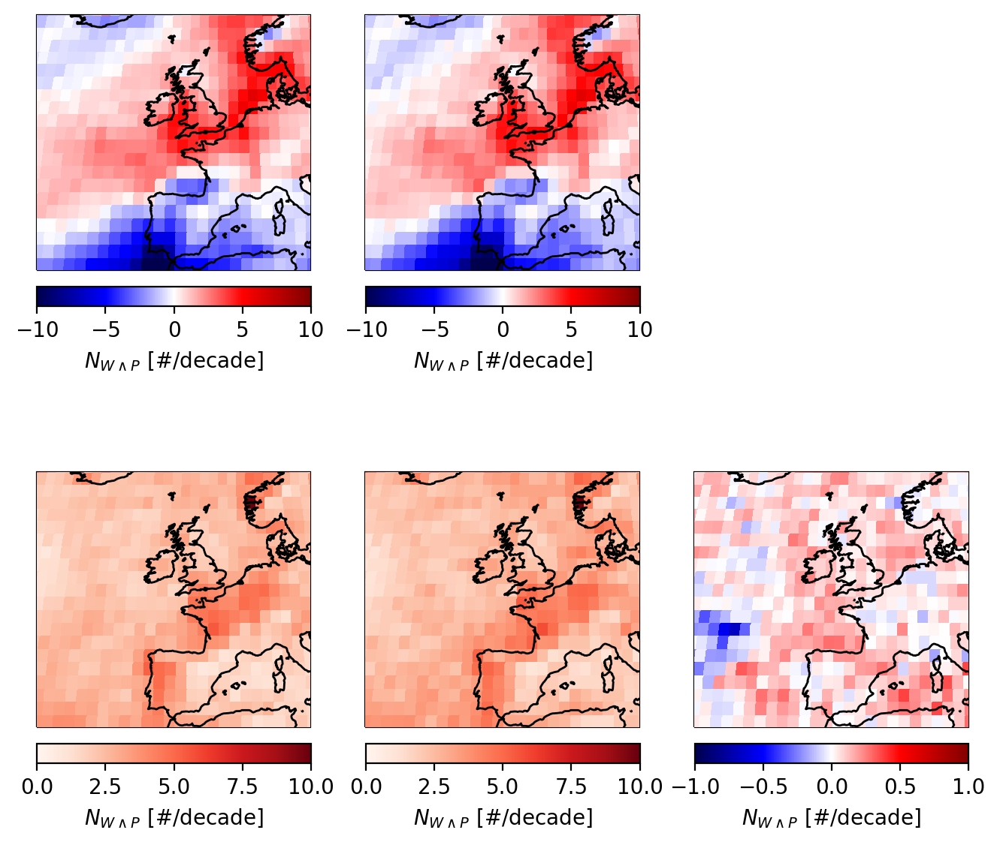

In [5]:
ssp='ssp585'
ssp_ds_diff = n_wp_diff.sel(ssp=ssp)

finite_mems = np.isfinite(ssp_ds_diff.isel(latitude=0,longitude=0))

members= np.zeros((len(ssp_ds_diff.source_id)))
for i in np.arange(len(ssp_ds_diff.source_id)):
    try:
        members[i] = np.where(finite_mems[i,:])[0][0]
    except:
        members[i] = 0
ix = xr.DataArray(members,dims=['source_id'],coords={'source_id':ssp_ds_diff.source_id})

onemem_ens = ssp_ds_diff.isel(member_id=ix.astype('int'))
ensmean_all = ssp_ds_diff.mean(dim='member_id').mean(dim='source_id')
ensmean_1mem = ssp_ds_diff.isel(member_id=ix.astype('int')).mean(dim='source_id')

ensmean_all_spread = ssp_ds_diff.mean(dim='member_id').std(dim='source_id')
ensmean_1mem_spread = ssp_ds_diff.isel(member_id=ix.astype('int')).std(dim='source_id')
    
fig=plt.figure(figsize=(8,7.25)) #generate figure  
gs = fig.add_gridspec(2,3)
gs.update(hspace=.2)


#historical CMIP
ax = plt.subplot(gs[0,0],projection=ccrs.Robinson(central_longitude=0))

ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

sc = (.25*ensmean_all).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

ax.coastlines(zorder=5)
#sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{W\wedge P}$ [#/decade]')
ax.set_title('')

sc.set_edgecolor('face')


ax = plt.subplot(gs[0,1],projection=ccrs.Robinson(central_longitude=0))

ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

sc = (.25*ensmean_1mem).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

ax.coastlines(zorder=5)
#sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{W\wedge P}$ [#/decade]')
ax.set_title('')

sc.set_edgecolor('face')


ax = plt.subplot(gs[1,0],projection=ccrs.Robinson(central_longitude=0))

ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

sc = (.25*ensmean_all_spread).plot(cmap='Reds',vmin=0,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

ax.coastlines(zorder=5)
#sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{W\wedge P}$ [#/decade]')
ax.set_title('')

sc.set_edgecolor('face')


ax = plt.subplot(gs[1,1],projection=ccrs.Robinson(central_longitude=0))

ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

sc = (.25*ensmean_1mem_spread).plot(cmap='Reds',vmin=0,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

ax.coastlines(zorder=5)
#sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{W\wedge P}$ [#/decade]')
ax.set_title('')

sc.set_edgecolor('face')





ax = plt.subplot(gs[1,2],projection=ccrs.Robinson(central_longitude=0))

ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

sc = ((ensmean_1mem_spread-ensmean_all_spread)/ensmean_1mem_spread).plot(cmap='seismic',vmin=-1,vmax=1,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

ax.coastlines(zorder=5)
#sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{W\wedge P}$ [#/decade]')
ax.set_title('')

sc.set_edgecolor('face')

100*((ensmean_1mem_spread-ensmean_all_spread)/ensmean_1mem_spread).mean()

Check if the average difference between members goes to 0 for the CanESM5 ensemble

Text(-2.5, 1.3, 'Ensemble mean change')

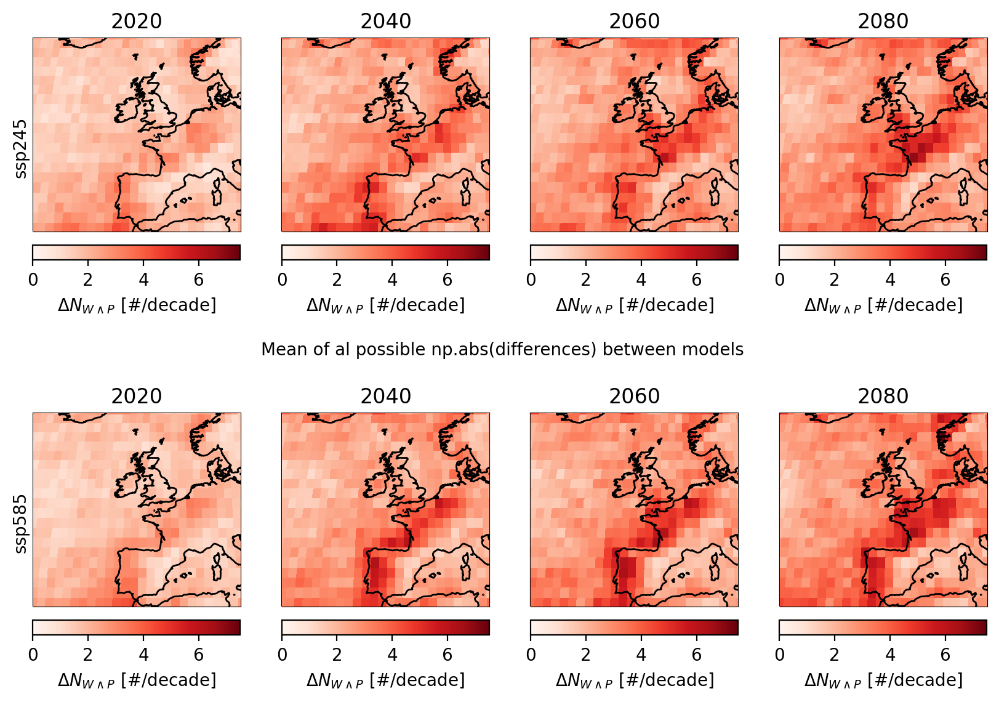

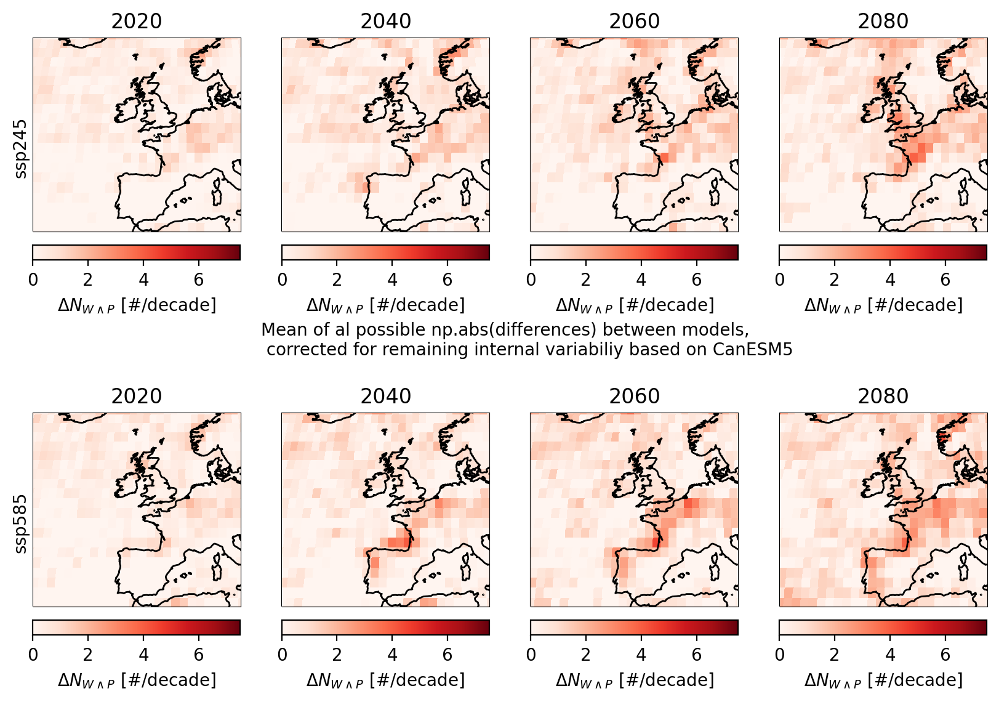

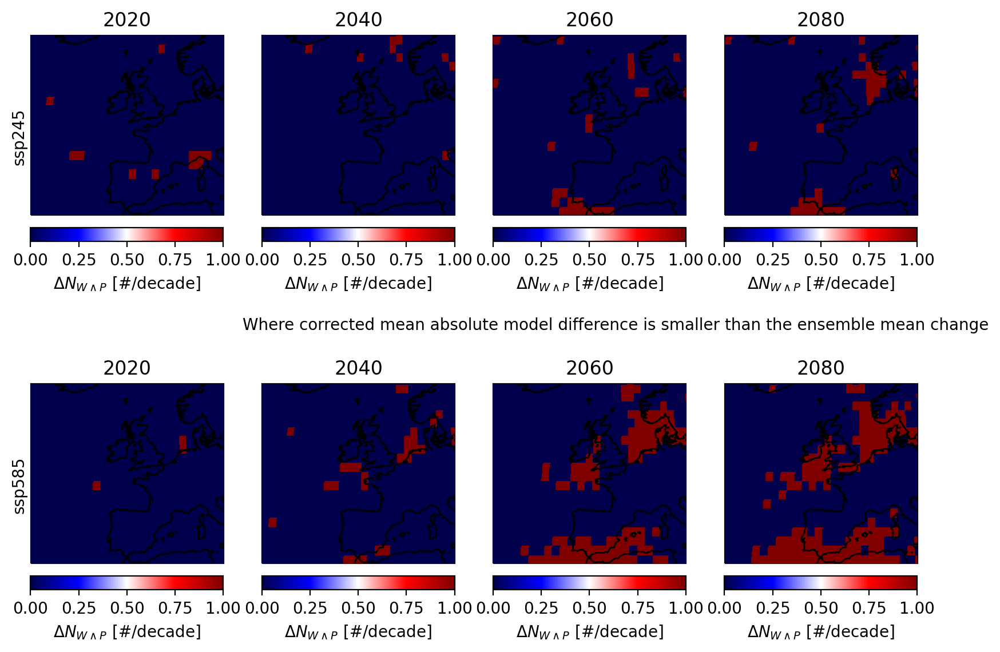

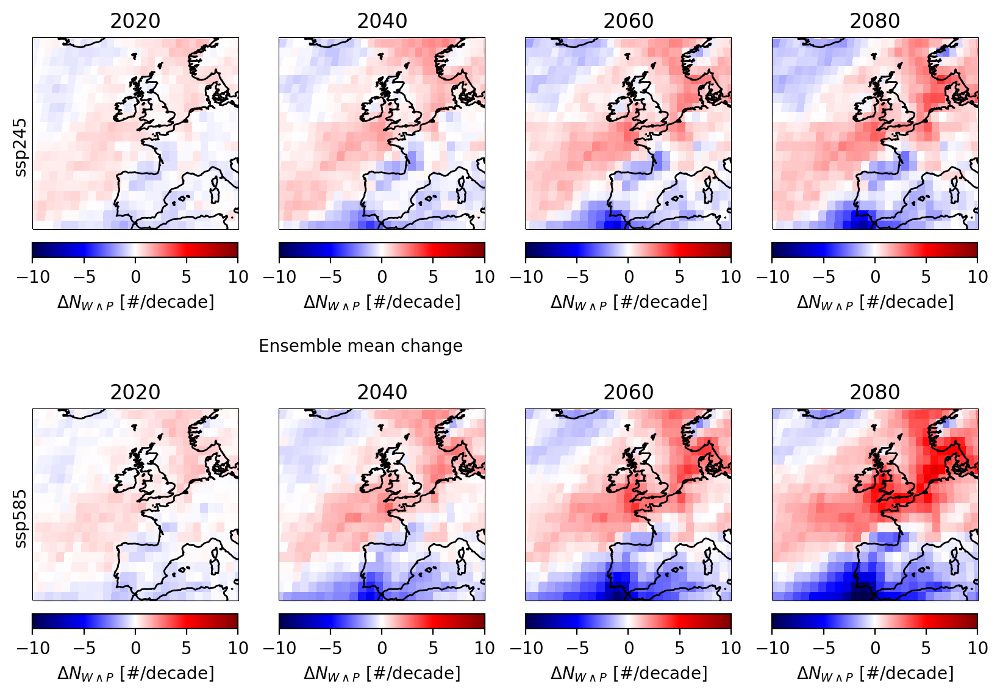

In [77]:
fig=plt.figure(figsize=(10,7.25)) #generate figure  
gs = fig.add_gridspec(2,4)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

        finite_mems = np.isfinite(ssp_ds_diff.isel(latitude=0,longitude=0))

        members= np.zeros((len(ssp_ds_diff.source_id)))
        for i in np.arange(len(ssp_ds_diff.source_id)):
            try:
                members[i] = np.where(finite_mems[i,:])[0][0]
            except:
                members[i] = 0
        ix = xr.DataArray(members,dims=['source_id'],coords={'source_id':ssp_ds_diff.source_id})

        onemem_ens = ssp_ds_diff.isel(member_id=ix.astype('int'))
        onemem_ens = onemem_ens.sel(source_id = onemem_ens.source_id[np.isfinite(onemem_ens.isel(latitude=0,longitude=0)).values])

        onemem_ens_diffs = onemem_ens-onemem_ens.rename(source_id='s2')
        n_models = len(onemem_ens.source_id)

        #compute all possible differences between members
        c = onemem_ens_diffs.stack(i=('source_id','s2')).isel(i=np.ravel_multi_index(np.tril_indices(n_models,k=-1),(n_models,n_models)))




        #historical CMIP
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (.25*np.abs(c).mean(dim='i')).plot(cmap='Reds',vmin=0,vmax=7.5,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        
        if w==0:
            ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
ax.annotate('Mean of al possible np.abs(differences) between models',xy=(-2.5,1.3),xycoords='axes fraction')



fig=plt.figure(figsize=(10,7.25)) #generate figure  
gs = fig.add_gridspec(2,4)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

        finite_mems = np.isfinite(ssp_ds_diff.isel(latitude=0,longitude=0))

        members= np.zeros((len(ssp_ds_diff.source_id)))
        for i in np.arange(len(ssp_ds_diff.source_id)):
            try:
                members[i] = np.where(finite_mems[i,:])[0][0]
            except:
                members[i] = 0
        ix = xr.DataArray(members,dims=['source_id'],coords={'source_id':ssp_ds_diff.source_id})

        onemem_ens = ssp_ds_diff.isel(member_id=ix.astype('int'))
        onemem_ens = onemem_ens.sel(source_id = onemem_ens.source_id[np.isfinite(onemem_ens.isel(latitude=0,longitude=0)).values])

        onemem_ens_diffs = onemem_ens-onemem_ens.rename(source_id='s2')
        n_models = len(onemem_ens.source_id)

        #compute all possible differences between members
        c = onemem_ens_diffs.stack(i=('source_id','s2')).isel(i=np.ravel_multi_index(np.tril_indices(n_models,k=-1),(n_models,n_models)))


        canesm_ds = ssp_ds_diff.sel(source_id='CanESM5').dropna(dim='member_id').isel(member_id=np.arange(len(onemem_ens.source_id)))
        canesm_diffs = canesm_ds-canesm_ds.rename(member_id='m2')
        n_mems = len(canesm_ds.member_id)

        #compute all possible differences between members
        b = canesm_diffs.stack(i=('member_id','m2')).isel(i=np.ravel_multi_index(np.tril_indices(n_mems,k=-1),(n_mems,n_mems)))
        x = b.isel(i=np.arange(len(c.i)))
        d = np.abs(c)-np.abs(x.values)
        #historical CMIP
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (.25*(np.abs(c).mean(dim='i')-np.abs(x).mean(dim='i'))).plot(cmap='Reds',vmin=0,vmax=7.5,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        #sc = (.25*np.abs(d).mean(dim='i')).plot(cmap='Reds',vmin=0,vmax=7.5,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        
        if w==0:
            ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
ax.annotate('Mean of al possible np.abs(differences) between models,\n corrected for remaining internal variabiliy based on CanESM5',xy=(-2.5,1.3),xycoords='axes fraction')


        
fig=plt.figure(figsize=(10,7.25)) #generate figure  
gs = fig.add_gridspec(2,4)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

        finite_mems = np.isfinite(ssp_ds_diff.isel(latitude=0,longitude=0))

        members= np.zeros((len(ssp_ds_diff.source_id)))
        for i in np.arange(len(ssp_ds_diff.source_id)):
            try:
                members[i] = np.where(finite_mems[i,:])[0][0]
            except:
                members[i] = 0
        ix = xr.DataArray(members,dims=['source_id'],coords={'source_id':ssp_ds_diff.source_id})

        onemem_ens = ssp_ds_diff.isel(member_id=ix.astype('int'))
        onemem_ens = onemem_ens.sel(source_id = onemem_ens.source_id[np.isfinite(onemem_ens.isel(latitude=0,longitude=0)).values])

        onemem_ens_diffs = onemem_ens-onemem_ens.rename(source_id='s2')
        n_models = len(onemem_ens.source_id)

        #compute all possible differences between members
        c = onemem_ens_diffs.stack(i=('source_id','s2')).isel(i=np.ravel_multi_index(np.tril_indices(n_models,k=-1),(n_models,n_models)))


        canesm_ds = ssp_ds_diff.sel(source_id='CanESM5').dropna(dim='member_id').isel(member_id=np.arange(len(onemem_ens.source_id)))
        canesm_diffs = canesm_ds-canesm_ds.rename(member_id='m2')
        n_mems = len(canesm_ds.member_id)

        #compute all possible differences between members
        b = canesm_diffs.stack(i=('member_id','m2')).isel(i=np.ravel_multi_index(np.tril_indices(n_mems,k=-1),(n_mems,n_mems)))


        #historical CMIP
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (((np.abs(c).mean(dim='i')-np.abs(b.mean(dim='i'))))<np.abs(ssp_ds_diff.mean(dim='member_id').mean(dim='source_id'))).plot(cmap='seismic',vmin=0,vmax=1,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        
        if w==0:
            ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
ax.annotate('Where corrected mean absolute model difference is smaller than the ensemble mean change',xy=(-2.5,1.3),xycoords='axes fraction')


fig=plt.figure(figsize=(10,7.25)) #generate figure  
gs = fig.add_gridspec(2,4)



for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

        #historical CMIP
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (.25*(ssp_ds_diff.mean(dim='member_id').mean(dim='source_id'))).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        
        if w==0:
            ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
ax.annotate('Ensemble mean change',xy=(-2.5,1.3),xycoords='axes fraction')


Text(-2.5, 1.3, 'Mean of al possible np.abs(differences) between models,\n corrected for remaining internal variabiliy based on CanESM5')

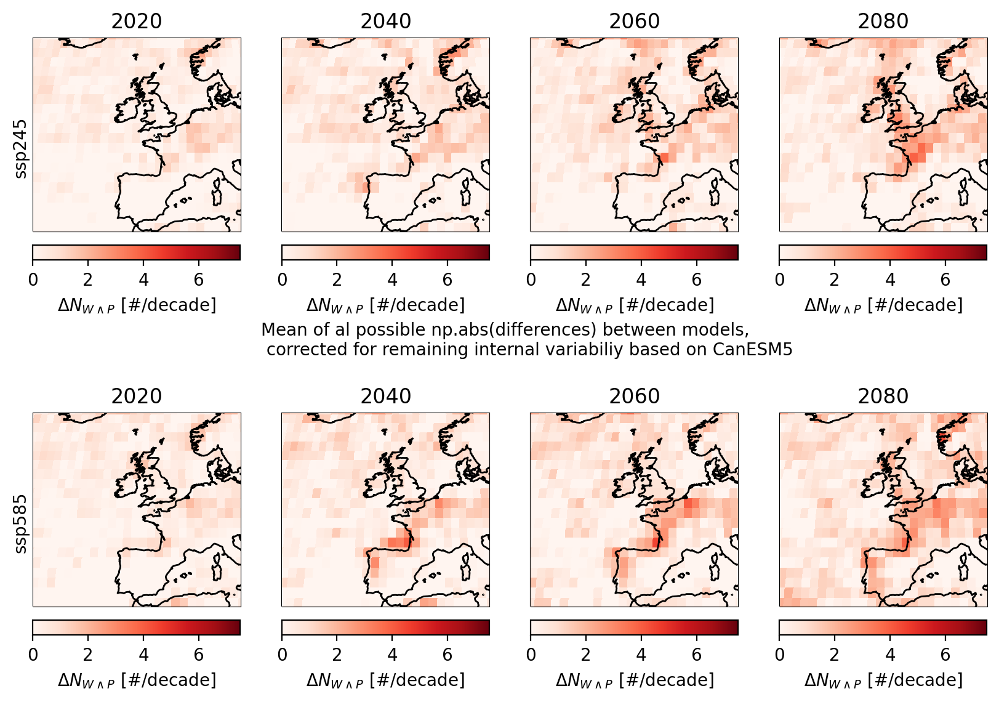

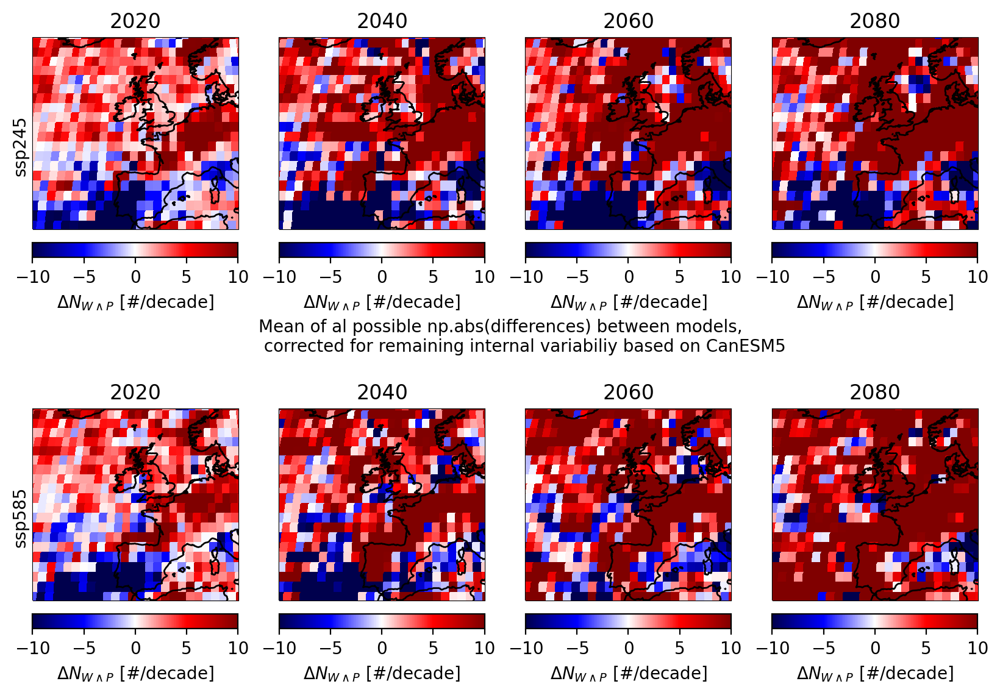

In [102]:

fig=plt.figure(figsize=(10,7.25)) #generate figure  
gs = fig.add_gridspec(2,4)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

        finite_mems = np.isfinite(ssp_ds_diff.isel(latitude=0,longitude=0))

        members= np.zeros((len(ssp_ds_diff.source_id)))
        for i in np.arange(len(ssp_ds_diff.source_id)):
            try:
                members[i] = np.where(finite_mems[i,:])[0][0]
            except:
                members[i] = 0
        ix = xr.DataArray(members,dims=['source_id'],coords={'source_id':ssp_ds_diff.source_id})

        onemem_ens = ssp_ds_diff.isel(member_id=ix.astype('int'))
        onemem_ens = onemem_ens.sel(source_id = onemem_ens.source_id[np.isfinite(onemem_ens.isel(latitude=0,longitude=0)).values])

        onemem_ens_diffs = onemem_ens-onemem_ens.rename(source_id='s2')
        n_models = len(onemem_ens.source_id)

        #compute all possible differences between members
        c = onemem_ens_diffs.stack(i=('source_id','s2')).isel(i=np.ravel_multi_index(np.tril_indices(n_models,k=-1),(n_models,n_models)))


        canesm_ds = ssp_ds_diff.sel(source_id='CanESM5').dropna(dim='member_id').isel(member_id=np.arange(len(onemem_ens.source_id)))
        canesm_diffs = canesm_ds-canesm_ds.rename(member_id='m2')
        n_mems = len(canesm_ds.member_id)

        #compute all possible differences between members
        b = canesm_diffs.stack(i=('member_id','m2')).isel(i=np.ravel_multi_index(np.tril_indices(n_mems,k=-1),(n_mems,n_mems)))
        x = b.isel(i=np.arange(len(c.i)))
        d = np.abs(c)-np.abs(x.values)
        #historical CMIP
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (.25*(np.abs(c).mean(dim='i')-np.abs(x).mean(dim='i'))).plot(cmap='Reds',vmin=0,vmax=7.5,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        #sc = (.25*np.abs(d).mean(dim='i')).plot(cmap='Reds',vmin=0,vmax=7.5,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        
        if w==0:
            ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
ax.annotate('Mean of al possible np.abs(differences) between models,\n corrected for remaining internal variabiliy based on CanESM5',xy=(-2.5,1.3),xycoords='axes fraction')


fig=plt.figure(figsize=(10,7.25)) #generate figure  
gs = fig.add_gridspec(2,4)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

        finite_mems = np.isfinite(ssp_ds_diff.isel(latitude=0,longitude=0))

        members= np.zeros((len(ssp_ds_diff.source_id)))
        for i in np.arange(len(ssp_ds_diff.source_id)):
            try:
                members[i] = np.where(finite_mems[i,:])[0][0]
            except:
                members[i] = 0
        ix = xr.DataArray(members,dims=['source_id'],coords={'source_id':ssp_ds_diff.source_id})

        onemem_ens = ssp_ds_diff.isel(member_id=ix.astype('int'))
        onemem_ens = onemem_ens.sel(source_id = onemem_ens.source_id[np.isfinite(onemem_ens.isel(latitude=0,longitude=0)).values])

        onemem_ens_diffs = onemem_ens-onemem_ens.rename(source_id='s2')
        n_models = len(onemem_ens.source_id)

        #compute all possible differences between members
        c = onemem_ens_diffs.stack(i=('source_id','s2')).isel(i=np.ravel_multi_index(np.tril_indices(n_models,k=-1),(n_models,n_models)))


        canesm_ds = ssp_ds_diff.sel(source_id='CanESM5').dropna(dim='member_id').isel(member_id=np.arange(len(onemem_ens.source_id)))
        canesm_diffs = canesm_ds-canesm_ds.rename(member_id='m2')
        n_mems = len(canesm_ds.member_id)

        #compute all possible differences between members
        b = canesm_diffs.stack(i=('member_id','m2')).isel(i=np.ravel_multi_index(np.tril_indices(n_mems,k=-1),(n_mems,n_mems)))
        
        d = np.abs(c)-np.abs(b.values)
        #historical CMIP
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        #sc = (.25*(np.abs(c).mean(dim='i')-np.abs(x).mean(dim='i'))).plot(cmap='Reds',vmin=0,vmax=7.5,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        #sc = (.25*d.mean(dim='i')).plot(cmap='Reds',vmin=0,vmax=7.5,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc = (.25*(onemem_ens.var(dim='source_id')-canesm_ds.var(dim='member_id'))).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        
        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        
        if w==0:
            ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
ax.annotate('Mean of al possible np.abs(differences) between models,\n corrected for remaining internal variabiliy based on CanESM5',xy=(-2.5,1.3),xycoords='axes fraction')



Text(-2.5, 1.3, 'Where SSP difference larger than mean of np.abs(differences)')

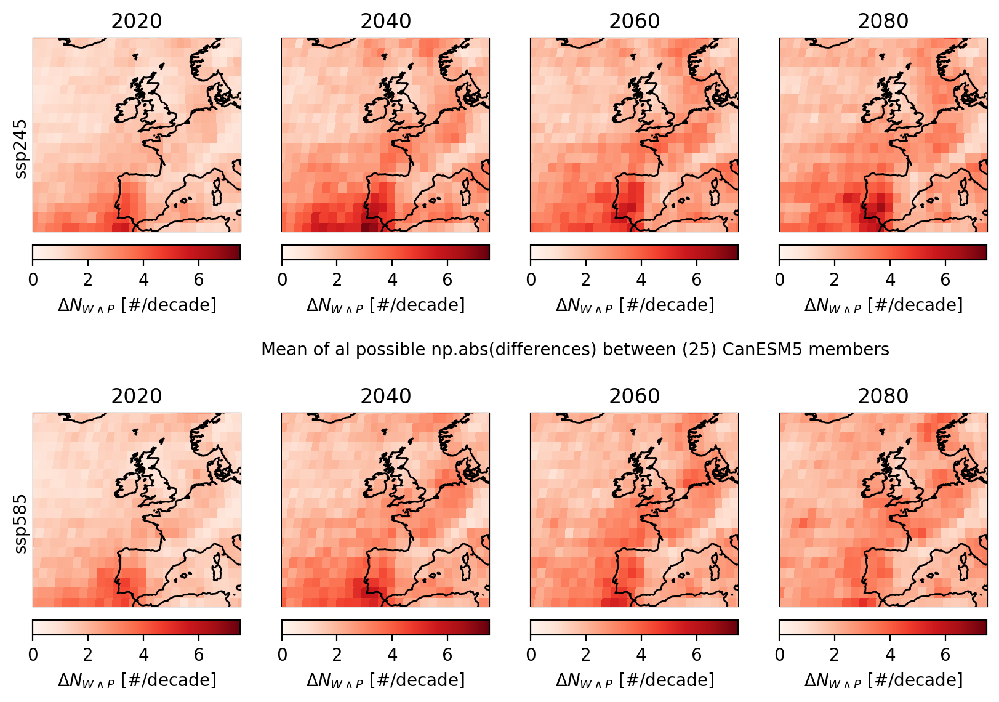

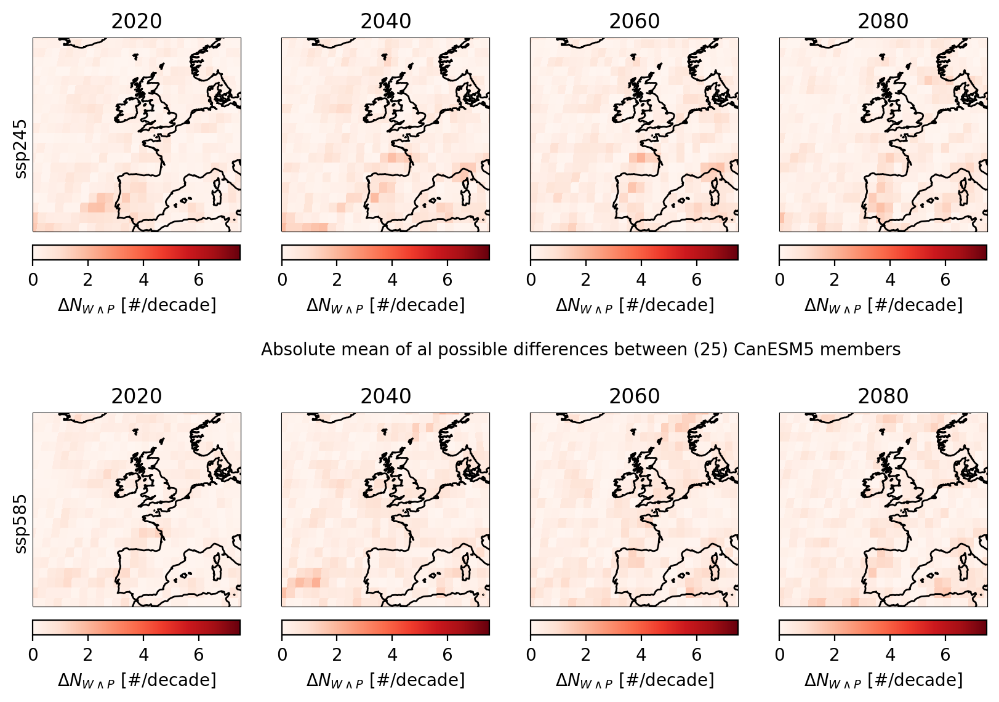

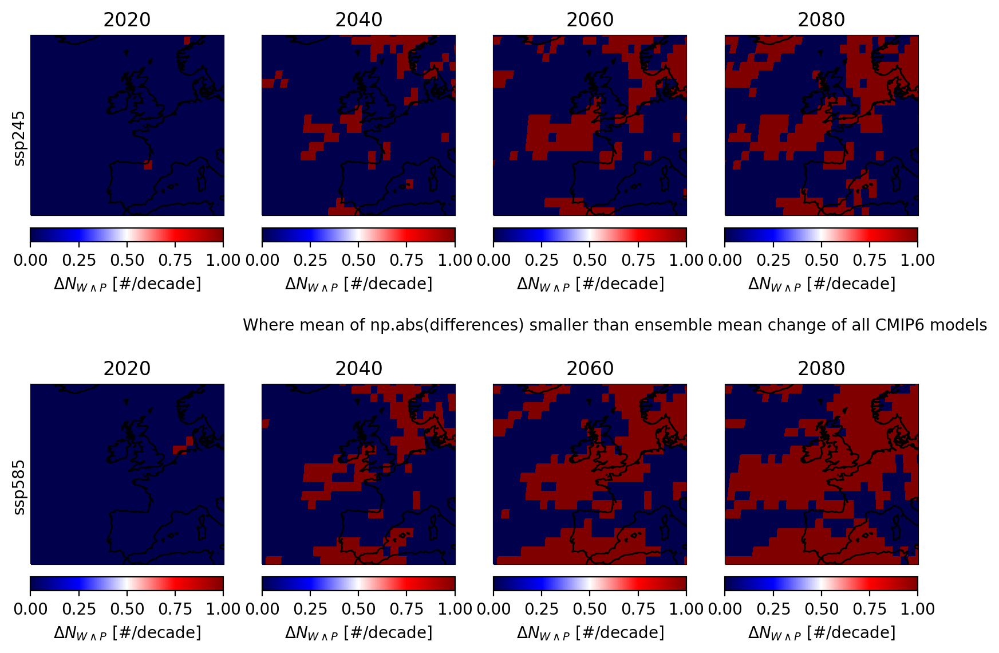

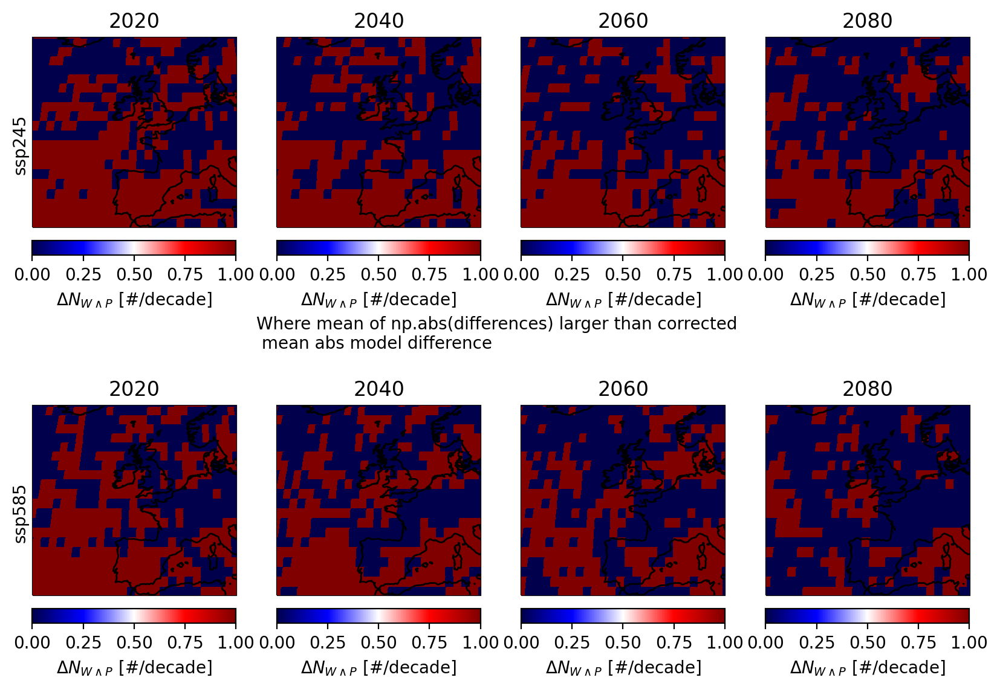

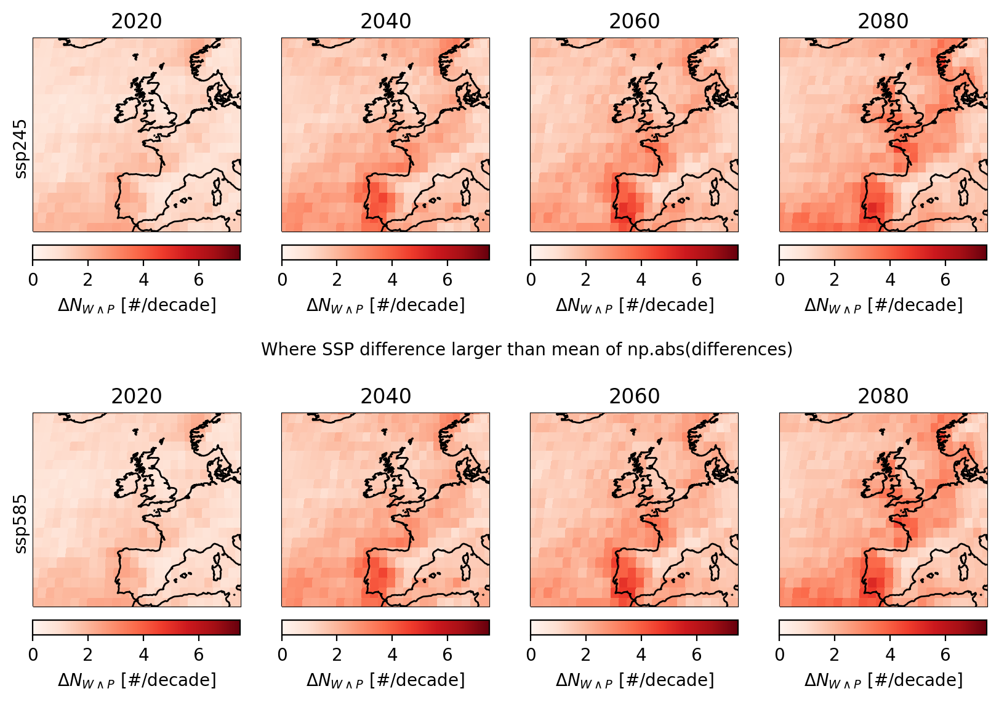

In [17]:
fig=plt.figure(figsize=(10,7.25)) #generate figure  
gs = fig.add_gridspec(2,4)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)
        
        canesm_ds =(ssp_ds_diff).sel(source_id='CanESM5').dropna(dim='member_id')
        canesm_diffs = canesm_ds-canesm_ds.rename(member_id='m2')
        n_mems = len(canesm_ds.member_id)

        #compute all possible differences between members
        b = canesm_diffs.stack(i=('member_id','m2')).isel(i=np.ravel_multi_index(np.tril_indices(n_mems,k=-1),(n_mems,n_mems)))


        #historical CMIP
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (.25*np.abs(b).mean(dim='i')).plot(cmap='Reds',vmin=0,vmax=7.5,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        
        if w==0:
            ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
ax.annotate('Mean of al possible np.abs(differences) between (25) CanESM5 members',xy=(-2.5,1.3),xycoords='axes fraction')



fig=plt.figure(figsize=(10,7.25)) #generate figure  
gs = fig.add_gridspec(2,4)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

        canesm_ds =ssp_ds_diff.sel(source_id='CanESM5').dropna(dim='member_id')
        canesm_diffs = canesm_ds-canesm_ds.rename(member_id='m2')
        n_mems = len(canesm_ds.member_id)

        #compute all possible differences between members
        b = canesm_diffs.stack(i=('member_id','m2')).isel(i=np.ravel_multi_index(np.tril_indices(n_mems,k=-1),(n_mems,n_mems)))


        #historical CMIP
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (.25*np.abs(b.mean(dim='i'))).plot(cmap='Reds',vmin=0,vmax=7.5,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        
        if w==0:
            ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
ax.annotate('Absolute mean of al possible differences between (25) CanESM5 members',xy=(-2.5,1.3),xycoords='axes fraction')



fig=plt.figure(figsize=(10,7.25)) #generate figure  
gs = fig.add_gridspec(2,4)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

        canesm_ds =(n_wp.sel(window=2000).sel(ssp=ssp)).sel(source_id='CanESM5').dropna(dim='member_id')
        canesm_diffs = canesm_ds-canesm_ds.rename(member_id='m2')
        n_mems = len(canesm_ds.member_id)

        #compute all possible differences between members
        b = canesm_diffs.stack(i=('member_id','m2')).isel(i=np.ravel_multi_index(np.tril_indices(n_mems,k=-1),(n_mems,n_mems)))


        #historical CMIP
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (np.abs(b).mean(dim='i')<np.abs(ssp_ds_diff.mean(dim='member_id').mean(dim='source_id'))).plot(cmap='seismic',vmin=0,vmax=1,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        #sc = (np.abs(b).mean(dim='i')<np.abs(ssp_ds_diff.mean(dim='member_id').sel(source_id='CanESM5'))).plot(cmap='seismic',vmin=0,vmax=1,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        
        if w==0:
            ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
ax.annotate('Where mean of np.abs(differences) smaller than ensemble mean change of all CMIP6 models',xy=(-2.5,1.3),xycoords='axes fraction')


fig=plt.figure(figsize=(10,7.25)) #generate figure  
gs = fig.add_gridspec(2,4)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)
        ssp_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp='ssp585') - (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp='ssp245')
        
        finite_mems = np.isfinite(ssp_ds_diff.isel(latitude=0,longitude=0))

        members= np.zeros((len(ssp_ds_diff.source_id)))
        for i in np.arange(len(ssp_ds_diff.source_id)):
            try:
                members[i] = np.where(finite_mems[i,:])[0][0]
            except:
                members[i] = 0
        ix = xr.DataArray(members,dims=['source_id'],coords={'source_id':ssp_ds_diff.source_id})

        onemem_ens = ssp_ds_diff.isel(member_id=ix.astype('int')).dropna(dim='source_id')


        onemem_ens_diffs = onemem_ens-onemem_ens.rename(source_id='s2')
        n_models = len(onemem_ens.source_id)

        #compute all possible differences between members
        c = onemem_ens_diffs.stack(i=('source_id','s2')).isel(i=np.ravel_multi_index(np.tril_indices(n_models,k=-1),(n_models,n_models)))
        
        
        canesm_ds =ssp_ds_diff.sel(source_id='CanESM5').dropna(dim='member_id')
        canesm_diffs = canesm_ds-canesm_ds.rename(member_id='m2')
        n_mems = len(canesm_ds.member_id)

        #compute all possible differences between members
        b = canesm_diffs.stack(i=('member_id','m2')).isel(i=np.ravel_multi_index(np.tril_indices(n_mems,k=-1),(n_mems,n_mems)))


        #historical CMIP
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (np.abs(b).mean(dim='i')>((np.abs(c).mean(dim='i')-np.abs(b.mean(dim='i'))))).plot(cmap='seismic',vmin=0,vmax=1,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        #sc = (((np.abs(c).mean(dim='i')-np.abs(b.mean(dim='i'))))>np.abs(ssp_diff).mean(dim='member_id').mean(dim='source_id')).plot(cmap='seismic',vmin=0,vmax=1,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        
        if w==0:
            ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
ax.annotate('Where mean of np.abs(differences) larger than corrected \n mean abs model difference',xy=(-2.5,1.3),xycoords='axes fraction')


fig=plt.figure(figsize=(10,7.25)) #generate figure  
gs = fig.add_gridspec(2,4)


for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)
        ssp_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp='ssp585') - (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp='ssp245')
    
        #historical CMIP
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (.25*np.abs(ssp_diff).mean(dim='member_id').mean(dim='source_id')).plot(cmap='Reds',vmin=0,vmax=7.5,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        
        if w==0:
            ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
ax.annotate('Where SSP difference larger than mean of np.abs(differences)',xy=(-2.5,1.3),xycoords='axes fraction')

test 4th order fits

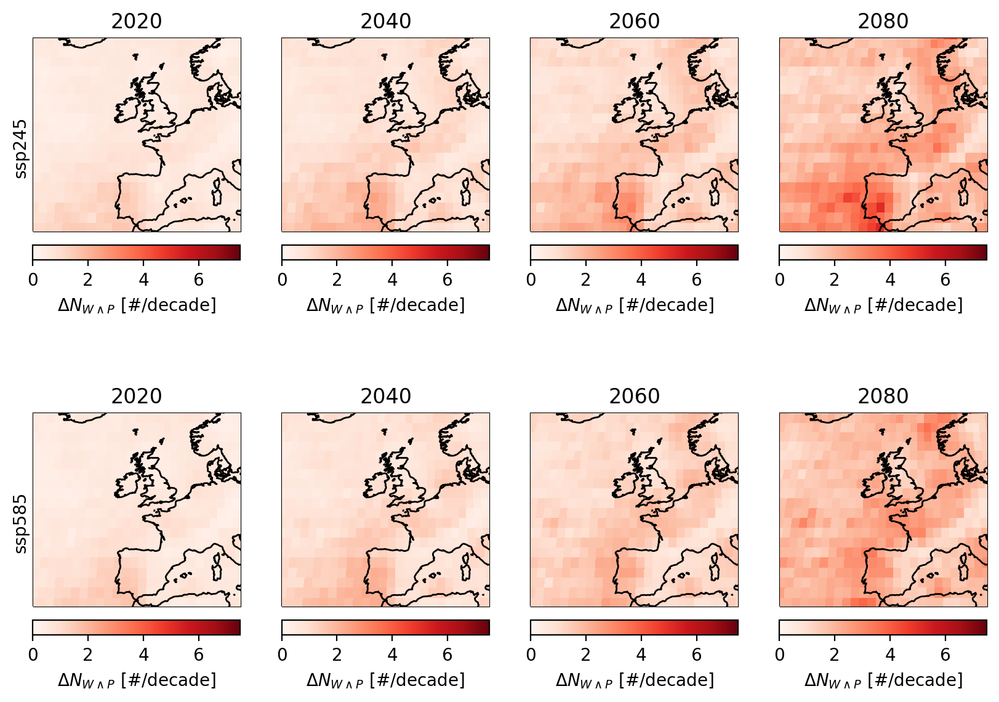

In [167]:
fig=plt.figure(figsize=(10,7.25)) #generate figure  
gs = fig.add_gridspec(2,4)

canesm_ds =(n_wp).sel(source_id='CanESM5').dropna(dim='member_id')
coefs = canesm_ds.polyfit(dim='window',deg=2)
fit = xr.polyval(canesm_ds.window,coefs)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        fit_diff = fit-fit.sel(window=2000)
        fit_var = fit_diff.isel(ssp=s).sel(window=window).var(dim='member_id')
        
        
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (.25*np.sqrt(fit_var.polyfit_coefficients)).plot(cmap='Reds',vmin=0,vmax=7.5,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        
        if w==0:
            ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
        #ax.annotate('Where SSP difference larger than mean of np.abs(differences)',xy=(-2.5,1.3),xycoords='axes fraction')
        

In [163]:
fit_diff.isel(ssp=s).sel(window=2040)

<xarray.Dataset>
Dimensions:               (member_id: 25, latitude: 27, longitude: 35)
Coordinates:
    ssp                   <U6 'ssp585'
  * member_id             (member_id) object 'r10i1p1f1' ... 'r9i1p1f1'
  * latitude              (latitude) float64 70.0 68.5 67.0 ... 34.0 32.5 31.0
  * longitude             (longitude) float64 -30.0 -28.5 -27.0 ... 19.5 21.0
    window                int64 2040
    source_id             <U15 'CanESM5'
    height                float64 10.0
    quantile              float64 0.98
Data variables:
    polyfit_coefficients  (member_id, latitude, longitude) float64 18.25 ... ...

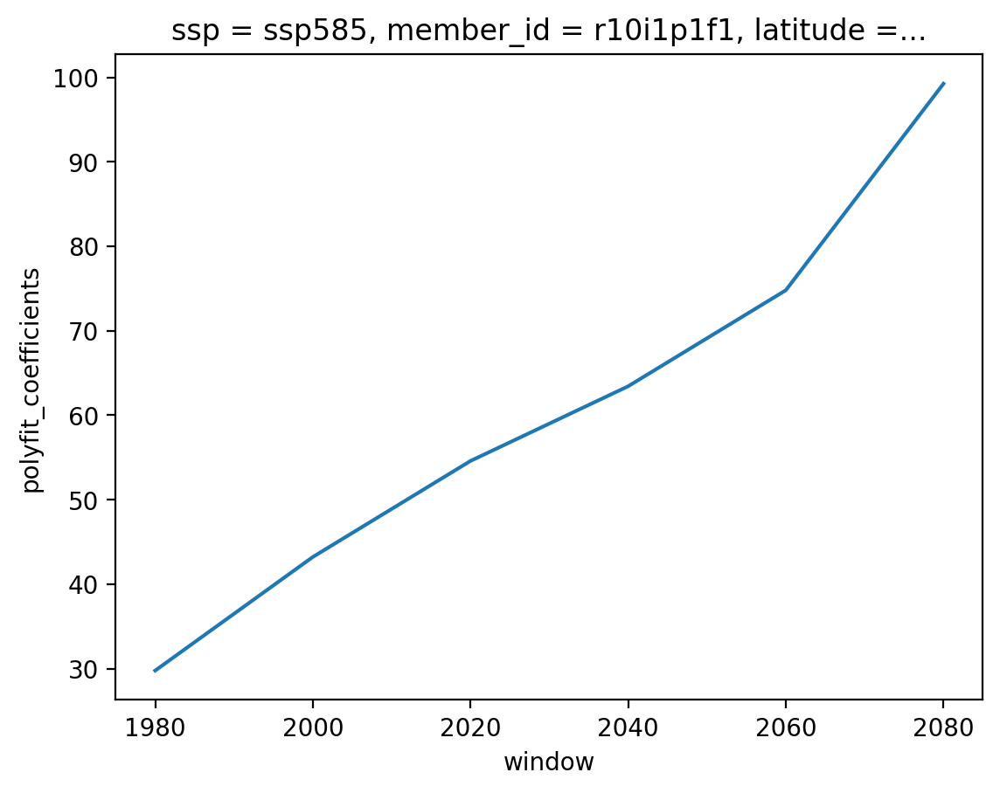

In [146]:
fit.isel(ssp=-1,member_id=0,latitude=0,longitude=0).polyfit_coefficients.plot()

In [129]:
fit_var.polyfit_coefficients

<xarray.DataArray 'polyfit_coefficients' (ssp: 2, latitude: 27, longitude: 35)>
array([[[42.13822041, 35.28324767, 28.22148376, ..., 23.4970991 ,
         10.51659233,  5.26164049],
        [28.19472131, 27.7518942 , 13.83890155, ...,  7.20159804,
          2.61180931,  2.65635918],
        [16.66393339, 22.56983706, 16.35901584, ...,  5.27337992,
          1.47677257,  4.15682416],
        ...,
        [79.8407262 , 64.04646531, 83.60859624, ..., 41.90668539,
         51.21177927, 43.49726171],
        [82.43058416, 74.1386658 , 69.16913437, ..., 46.97468865,
         28.89263804, 30.73483951],
        [73.51763135, 57.30925192, 44.38915788, ..., 22.59219069,
         36.4969711 , 21.80121992]],

       [[19.32066743, 21.60726531, 33.43480686, ..., 19.03807347,
         12.79587396,  7.67020865],
        [27.21695543, 26.91763461, 24.02786939, ...,  6.48466743,
          3.41833992,  3.24694073],
        [15.94614008, 13.83701355, 10.58905992, ...,  4.56714318,
          4.05206073,  4.84994743],
        ...,
        [43.17226971, 38.64223543, 62.20402743, ..., 23.05845029,
         28.79507396, 27.706624  ],
        [58.55443788, 55.3882449 , 81.94062041, ..., 17.89768033,
         22.04371396, 29.95746482],
        [73.01253878, 82.17501257, 69.26404767, ..., 21.57710824,
         22.4485551 , 21.61372278]]])
Coordinates:
  * ssp        (ssp) object 'ssp245' 'ssp585'
  * latitude   (latitude) float64 70.0 68.5 67.0 65.5 ... 35.5 34.0 32.5 31.0
  * longitude  (longitude) float64 -30.0 -28.5 -27.0 -25.5 ... 18.0 19.5 21.0
    source_id  <U15 'CanESM5'
    height     float64 10.0
    quantile   float64 0.98

In [116]:
fit.var(dim='member_id')

<xarray.Dataset>
Dimensions:               (ssp: 2, latitude: 27, longitude: 35, window: 6)
Coordinates:
  * ssp                   (ssp) object 'ssp245' 'ssp585'
  * latitude              (latitude) float64 70.0 68.5 67.0 ... 34.0 32.5 31.0
  * longitude             (longitude) float64 -30.0 -28.5 -27.0 ... 19.5 21.0
  * window                (window) int64 1980 2000 2020 2040 2060 2080
    source_id             <U15 'CanESM5'
    height                float64 10.0
    quantile              float64 0.98
Data variables:
    polyfit_coefficients  (window, ssp, latitude, longitude) float64 48.73 .....

type: 'DataArray' object has no attribute 'window'

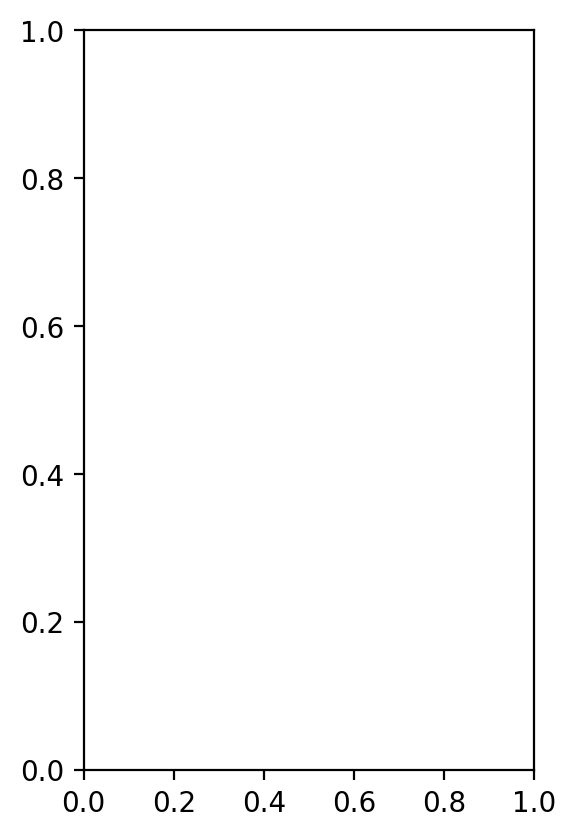

In [9]:
lat = 36
lon=-6
plt.figure()
gs = fig.add_gridspec(1,2)


ds_diff_ssp245 = (n_wp-n_wp.sel(window=2000)).sel(ssp='ssp245')#n_wp_diff.sel(ssp=ssp)
ds_diff_ssp585 = (n_wp-n_wp.sel(window=2000)).sel(ssp='ssp585')#n_wp_diff.sel(ssp=ssp)

ensmean_ssp245 = .25*ds_diff_ssp245.mean(dim='member_id').mean(dim='source_id').sel(latitude=lat,longitude=lon,method='nearest')
ensmean_ssp585 = .25*ds_diff_ssp585.mean(dim='member_id').mean(dim='source_id').sel(latitude=lat,longitude=lon,method='nearest')
spread_ssp245 = .25*ds_diff_ssp245.mean(dim='member_id').std(dim='source_id').sel(latitude=lat,longitude=lon,method='nearest')
spread_ssp585 = .25*ds_diff_ssp585.mean(dim='member_id').std(dim='source_id').sel(latitude=lat,longitude=lon,method='nearest')
ax = plt.subplot(gs[0,0])
ax.plot(ssp_ds_diff.window,ensmean_ssp245,color='gold')
ax.plot(ssp_ds_diff.window,ensmean_ssp585,color='red')
ax.plot(ssp_ds_diff.window,ensmean_ssp585-ensmean_ssp245,color='black',linestyle='dashed')
#ax.plot(ssp_ds_diff.window,spread_ssp585,color='lightgrey')
ax.set_ylim([-10,7.5])
ax.set_xlim([2040,2080])


for s,ssp in enumerate(['ssp245','ssp585']):
    ssp_ds_diff = (n_wp-n_wp.sel(window=2000)).sel(ssp=ssp)
    finite_mems = np.isfinite(ssp_ds_diff.isel(latitude=0,longitude=0,window=-1))

    members= np.zeros((len(ssp_ds_diff.source_id)))
    for i in np.arange(len(ssp_ds_diff.source_id)):
        try:
            members[i] = np.where(finite_mems[i,:])[0][0]
        except:
            members[i] = 0
    ix = xr.DataArray(members,dims=['source_id'],coords={'source_id':ssp_ds_diff.source_id})

    onemem_ens = ssp_ds_diff.isel(member_id=ix.astype('int'))


    onemem_ens_diffs = onemem_ens-onemem_ens.rename(source_id='s2')
    n_models = len(onemem_ens.source_id)

    #compute all possible differences between members
    c = onemem_ens_diffs.stack(i=('source_id','s2')).isel(i=np.ravel_multi_index(np.tril_indices(n_models,k=-1),(n_models,n_models)))
    
    
    canesm_ds = ssp_ds_diff.sel(source_id='CanESM5').dropna(dim='member_id').isel(member_id=np.arange(len(onemem_ens.source_id)))
    canesm_diffs = canesm_ds-canesm_ds.rename(member_id='m2')
    n_mems = len(canesm_ds.member_id)

    #compute all possible differences between members
    b = canesm_diffs.stack(i=('member_id','m2')).isel(i=np.ravel_multi_index(np.tril_indices(n_mems,k=-1),(n_mems,n_mems)))
    ax.plot(ssp_ds_diff.window,.25*np.abs(b).mean(dim='i').sel(latitude=lat,longitude=lon,method='nearest'),color='grey')
    ax.plot(ssp_ds_diff.window,.25*(np.abs(c).mean(dim='i')-np.abs(b.mean(dim='i'))).sel(latitude=lat,longitude=lon,method='nearest'),color='lightgreen')
    

diffs between mems of same model

In [8]:
n_mc = 500

n = 2


i_smiles = np.where(np.isfinite(n_wp_pd).sum(dim='member_id').sel(ssp='ssp585').isel(latitude=0,longitude=0)>(n-1))[0]
#i_smiles = np.where(np.isfinite(n_wp_pd).sum(dim='member_id').sel(ssp='ssp585').isel(latitude=0,longitude=0)>9)[0]
finite_mems = np.isfinite(n_wp_pd.isel(source_id=i_smiles).isel(latitude=0,longitude=0,ssp=1))

num_smiles = len(i_smiles)

rand_smile = np.random.randint(0,num_smiles-1,n_mc)

rand_i_smile_mems = np.zeros((len(rand_smile),n))
for s,i_smile in enumerate(rand_smile):
    rand_i_smile_mems[s,:] = np.random.choice(np.where(finite_mems[i_smile,:])[0],n,replace=False)

rand_smiles = xr.DataArray(rand_smile,dims=['sample'],coords={'sample':np.arange(n_mc)})
rand_smile_mems = xr.DataArray(rand_i_smile_mems,dims=['sample','n'],coords={'sample':np.arange(n_mc),'n':np.arange(n)})

rand_mems_data = n_wp_pd.sel(ssp='ssp585').isel(source_id=i_smiles).isel(source_id=rand_smiles).isel(member_id=rand_smile_mems.astype('int'))
mem_diff_mean = np.abs(rand_mems_data.diff(dim='n')).mean(dim='sample').load()
mem_diff_95 = np.abs(rand_mems_data.diff(dim='n')).quantile(.95,dim='sample').load()

diffs between single mems of different models

In [9]:
n_mc = 500

n = 2
finite_mems = np.isfinite(n_wp_diff.isel(latitude=0,longitude=0,ssp=1)).compute()

n_wp_diff = n_wp_diff.sel(source_id=finite_mems.source_id[np.sum(finite_mems,axis=-1)>0].values)
#n_wp_diff = n_wp_diff.sel(source_id=finite_mems.source_id[np.sum(finite_mems,axis=-1)>9].values)
finite_mems = np.isfinite(n_wp_diff.isel(latitude=0,longitude=0,ssp=1)).compute()

num_models = len(n_wp_diff.source_id)
i_rand_models = np.zeros((n_mc,n))
i_rand_model_rand_mem = np.zeros((n_mc,n))

for sample in np.arange(n_mc):
    i_rand_models[sample,:] = np.random.choice(np.arange(num_models),n,replace=False)
    for k in np.arange(n):
        i_rand_model_rand_mem[sample,k] = np.random.choice(np.where(finite_mems[i_rand_models[sample,k].astype('int'),:])[0],1)

rand_models = xr.DataArray(i_rand_models,dims=['sample','n'],coords={'sample':np.arange(n_mc),'n':np.arange(n)})
rand_models_mems = xr.DataArray( i_rand_model_rand_mem,dims=['sample','n'],coords={'sample':np.arange(n_mc),'n':np.arange(n)})

rand_model_mem_data = n_wp_diff.sel(ssp='ssp585').isel(source_id=rand_models.astype('int')).isel(member_id=rand_models_mems.astype('int'))
model_diff_mean = np.abs(rand_model_mem_data.diff(dim='n')-rand_mems_data.diff(dim='n')).mean(dim='sample').load()

In [10]:
model_diff_gt_mem_diff = model_diff_mean>mem_diff_mean
model_diff_gt_ensmean = model_diff_mean>np.abs(n_wp_diff.sel(ssp='ssp585').mean(dim='member_id').mean(dim='source_id'))
mem_diff_gt_ensmean = mem_diff_mean>np.abs(n_wp_diff.sel(ssp='ssp585').mean(dim='member_id').mean(dim='source_id'))
mem_diff_95_gt_ensmean = mem_diff_95>np.abs(n_wp_diff.sel(ssp='ssp585').mean(dim='member_id').mean(dim='source_id'))

Text(-2.5, 1.3, 'ensemble mean diff between 2 members')

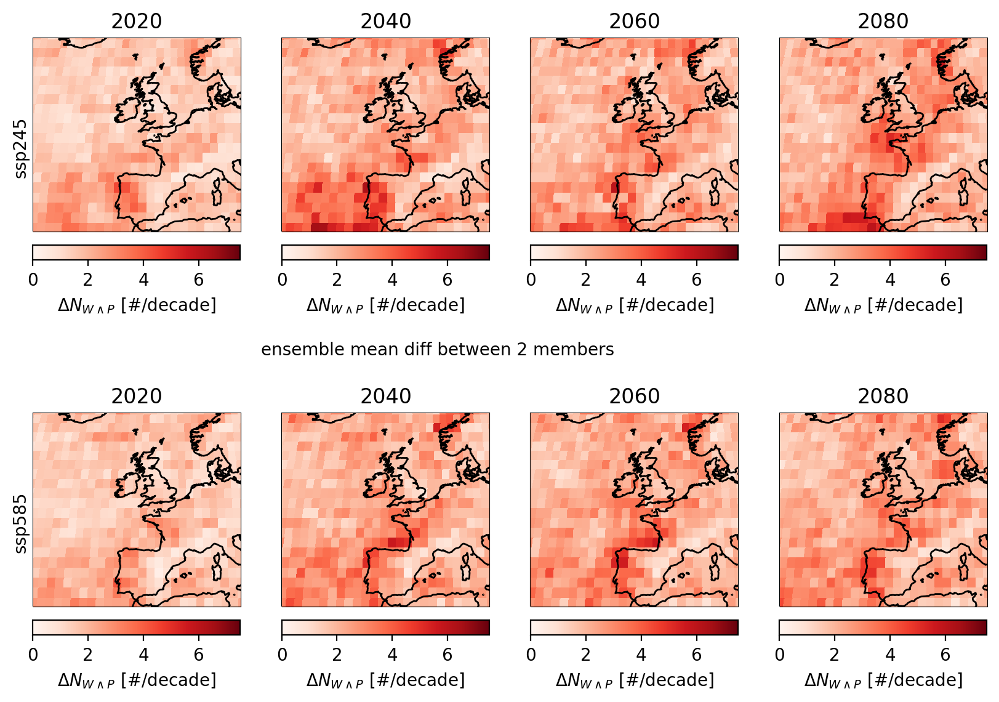

In [11]:
fig=plt.figure(figsize=(10,7.25)) #generate figure  
gs = fig.add_gridspec(2,4)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):

        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

        i_smiles = np.where(np.isfinite(ssp_ds_diff).sum(dim='member_id').isel(latitude=0,longitude=0)>(n-1))[0]

        finite_mems = np.isfinite(ssp_ds_diff.isel(source_id=i_smiles).isel(latitude=0,longitude=0))

        members= np.zeros((len(finite_mems.source_id),2))
        for i in np.arange(len(finite_mems.source_id)):
            members[i,:] = np.where(finite_mems[i,:])[0][0:2]
    
        ix = xr.DataArray(members,dims=['source_id','n'],coords={'source_id':finite_mems.source_id})

        ens_2mem = ssp_ds_diff.isel(source_id=i_smiles).isel(member_id=ix.astype('int'))#.diff(dim='n')).mean(dim='source_id')
        ensmean_2mem_diff = np.abs(ens_2mem.diff(dim='n')).mean(dim='source_id')
        
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (.25*ensmean_2mem_diff).plot(cmap='Reds',vmin=0,vmax=7.5,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        
        if w==0:
            ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
ax.annotate('ensemble mean diff between 2 members',xy=(-2.5,1.3),xycoords='axes fraction')

compute max difference between n-ensemble means

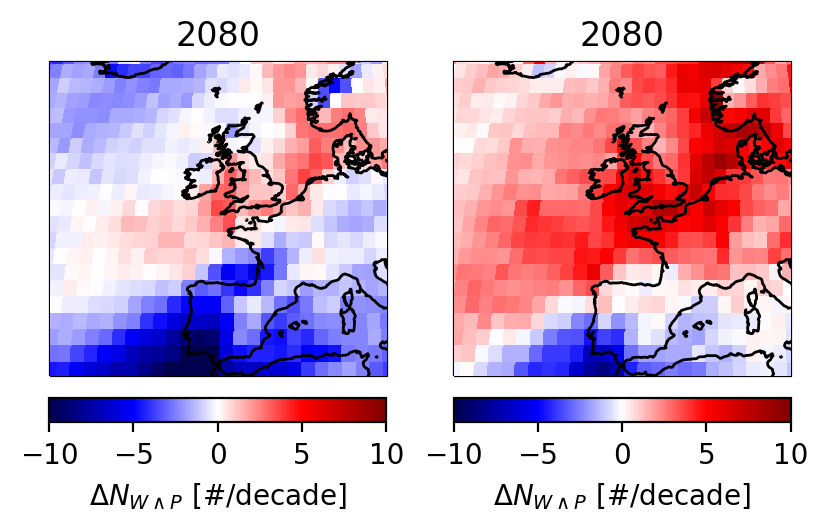

In [12]:
combs = list(itertools.combinations(np.arange(len(onemem_ens.source_id)), 6))
idx=np.random.randint(0,len(combs),size=300)
idx_ds = xr.DataArray(np.array([combs[k] for k in idx]),dims=['n','model'])

fig=plt.figure(figsize=(10,7.25)) #generate figure  
gs = fig.add_gridspec(2,4)


ax = plt.subplot(gs[0,0],projection=ccrs.Robinson(central_longitude=0))

ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

sc = (.25*onemem_ens.isel(source_id=idx_ds).mean(dim='model').quantile(.05,dim='n')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

ax.coastlines(zorder=5)
#sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
ax.set_title(str(window))

sc.set_edgecolor('face')


ax = plt.subplot(gs[0,1],projection=ccrs.Robinson(central_longitude=0))

ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

sc = (.25*onemem_ens.isel(source_id=idx_ds).mean(dim='model').quantile(.95,dim='n')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

ax.coastlines(zorder=5)
#sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
ax.set_title(str(window))

sc.set_edgecolor('face')

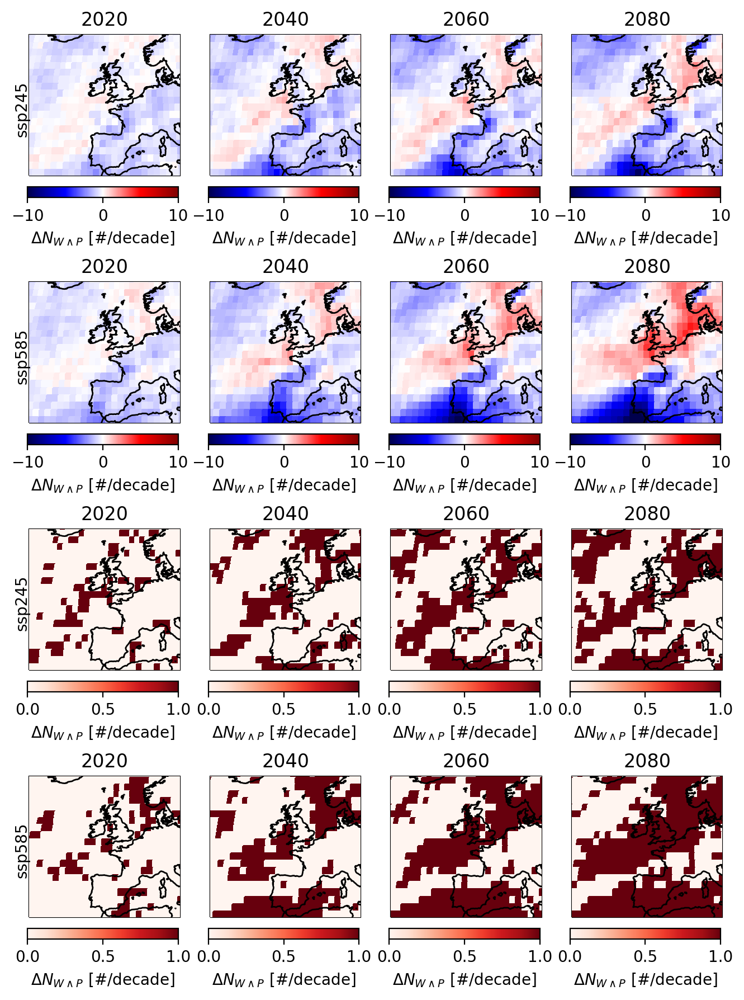

In [13]:
np.random.seed(seed=0)

fig=plt.figure(figsize=(8,11)) #generate figure  
gs = fig.add_gridspec(4,4)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

        
        finite_mems = np.isfinite(ssp_ds_diff.isel(latitude=0,longitude=0))

        members= np.zeros((len(ssp_ds_diff.source_id)))
        for i in np.arange(len(ssp_ds_diff.source_id)):
            try:
                members[i] = np.where(finite_mems[i,:])[0][0]
            except:
                members[i] = 0
        ix = xr.DataArray(members,dims=['source_id'],coords={'source_id':ssp_ds_diff.source_id})

        onemem_ens = ssp_ds_diff.isel(member_id=ix.astype('int')).dropna(dim='source_id')
        
        combs = list(itertools.combinations(np.arange(len(onemem_ens.source_id)), 6))
        idx=np.random.randint(0,len(combs),size=500)
        idx_ds = xr.DataArray(np.array([combs[k] for k in idx]),dims=['n','model'])
        
        std = np.sqrt(((onemem_ens.isel(source_id=idx_ds).mean(dim='model') - onemem_ens.mean(dim='source_id'))**2).mean(dim='n'))
        
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (.25*onemem_ens.isel(source_id=idx_ds).mean(dim='model').quantile(.17,dim='n')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        if w==0:
                ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
        
        ax = plt.subplot(gs[s+2,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        signs = np.sign(onemem_ens.isel(source_id=idx_ds).mean(dim='model'))
        num_positive = (signs==1).sum(dim='n')
        frac_pos = num_positive/len(signs.n)
        frac_neg = 1-frac_pos
        frac_agree = frac_pos
        frac_agree = frac_agree.where(frac_pos>frac_neg,frac_neg)
        
        ambiguous = (((num_positive/len(signs.n))>.1) & ((num_positive/len(signs.n))<.9))
        #np.sign(onemem_ens.isel(source_id=idx_ds).mean(dim='model')).all(dim='n')
        
        #sc = (.25*onemem_ens.isel(source_id=idx_ds).mean(dim='model').quantile(.83,dim='n')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        #sc = (~ambiguous).plot(cmap='seismic',vmin=0,vmax=1,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc = (frac_agree>.9).plot(cmap='Reds',vmin=0,vmax=1,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        #sc = (.25*std).plot(cmap='Reds',vmin=0,vmax=2,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        if w==0:
                ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)


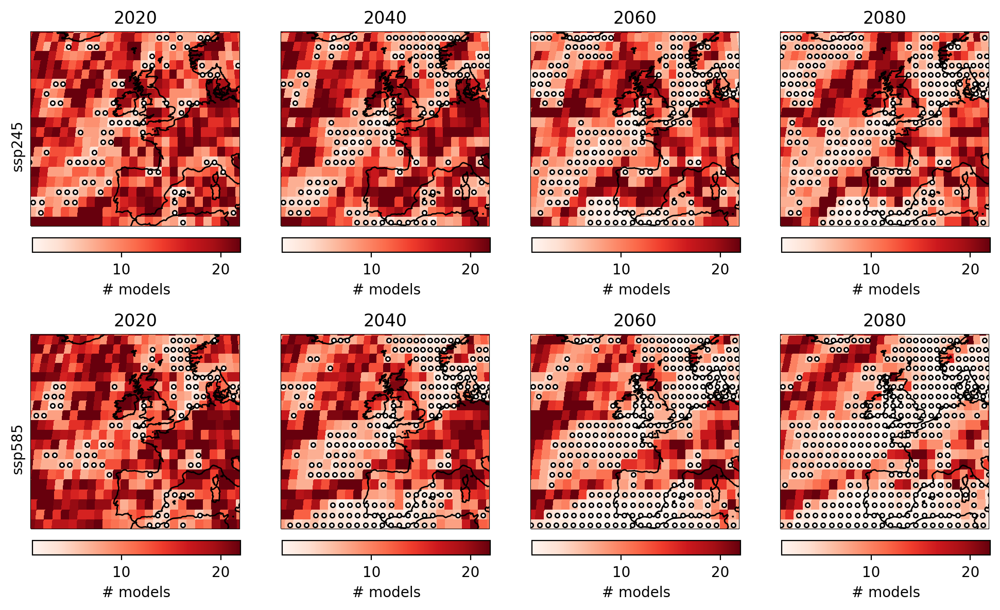

In [14]:
np.random.seed(seed=0)

fig=plt.figure(figsize=(12,7)) #generate figure  
gs = fig.add_gridspec(2,4)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

        
        finite_mems = np.isfinite(ssp_ds_diff.isel(latitude=0,longitude=0))

        members= np.zeros((len(ssp_ds_diff.source_id)))
        for i in np.arange(len(ssp_ds_diff.source_id)):
            try:
                members[i] = np.where(finite_mems[i,:])[0][0]
            except:
                members[i] = 0
        ix = xr.DataArray(members,dims=['source_id'],coords={'source_id':ssp_ds_diff.source_id})

        onemem_ens = ssp_ds_diff.isel(member_id=ix.astype('int')).dropna(dim='source_id')
        n_samps = 2000
        for i in np.arange(len(onemem_ens.source_id)-1):
            n_models = i+1
            combs = list(itertools.combinations(np.arange(len(onemem_ens.source_id)), n_models))
            if len(combs)>n_samps:
                idx=np.random.randint(0,len(combs),size=n_samps)
                idx_ds = xr.DataArray(np.array([combs[k] for k in idx]),dims=['n','model'])
            else:
                idx_ds = xr.DataArray(np.array([combs[k] for k in np.arange(len(combs))]),dims=['n','model'])
        
            signs = np.sign(onemem_ens.isel(source_id=idx_ds).mean(dim='model'))
            frac_positive = (signs==np.sign(ssp_ds_diff.mean(dim='member_id').mean(dim='source_id'))).sum(dim='n')/len(signs.n)
            if i==0:
                frac_positive_ds = frac_positive
            else:
                frac_positive_ds = xr.concat((frac_positive_ds,frac_positive),dim='n_models')
        frac_positive_ds = frac_positive_ds.assign_coords({'n_models':np.arange(len(onemem_ens.source_id)-1)+1})
        
        
        agrees = frac_positive_ds>=.9
        
        subsequent_sum = frac_positive_ds.copy(deep=True)
        for k in np.arange(len(agrees.n_models)):
            subsequent_sum[k,:,:] = agrees.where(agrees==1).isel(n_models=np.arange(k,len(agrees.n_models))).sum(dim='n_models',skipna=False).values
        
        
        #test = frac_positive_ds.where(frac_positive_ds>=.9,-999)
        
        agrees = agrees.where(np.isfinite(subsequent_sum),-999)
        #test = test.where(test!=0)
        first_n = agrees.argmax(dim='n_models')#.where(~np.isfinite(frac_positive_ds.where((frac_positive_ds>.1) & (frac_positive_ds<.9))))
        #first_n = first_n.where(frac_positive_ds.where(frac_positive_ds>=.9).all(dim='n_models'))
        first_n = first_n.where(agrees.any(dim='n_models'),100)
        first_n = first_n.where(np.isfinite(subsequent_sum.isel(n_models=first_n.astype('int'))),100)
        first_n = first_n+1
        #first n and all subsequent n also?
        
        
        
                                                                                     
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (first_n).plot(cmap='Reds',vmin=1,vmax=22,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        #first_n.plot.contour(levels=[1,6],colors=['black','grey'],transform=ccrs.PlateCarree(),ax=ax,zorder=10)
    
        
        [LON,LAT] = np.meshgrid(ssp_ds.longitude,ssp_ds.latitude)
        ax.scatter(LON.flatten()[first_n.values.flatten()<7],LAT.flatten()[first_n.values.flatten()<7],edgecolor='black',facecolor='white',transform=ccrs.PlateCarree(),zorder=7,marker='o',s=9)
    
        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='# models')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        if w==0:
                ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
        '''
        ax = plt.subplot(gs[s+2,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        signs = np.sign(onemem_ens.isel(source_id=idx_ds).mean(dim='model'))
        num_positive = (signs==1).sum(dim='n')
        frac_pos = num_positive/len(signs.n)
        frac_neg = 1-frac_pos
        frac_agree = frac_pos
        frac_agree = frac_agree.where(frac_pos>frac_neg,frac_neg)
        
        ambiguous = (((num_positive/len(signs.n))>.1) & ((num_positive/len(signs.n))<.9))
        #np.sign(onemem_ens.isel(source_id=idx_ds).mean(dim='model')).all(dim='n')
        
        #sc = (.25*onemem_ens.isel(source_id=idx_ds).mean(dim='model').quantile(.83,dim='n')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        #sc = (~ambiguous).plot(cmap='seismic',vmin=0,vmax=1,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc = (frac_agree).plot(cmap='Reds',vmin=.5,vmax=1,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        #sc = (.25*std).plot(cmap='Reds',vmin=0,vmax=2,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        if w==0:
                ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
        '''

(-20.0, 20.0)

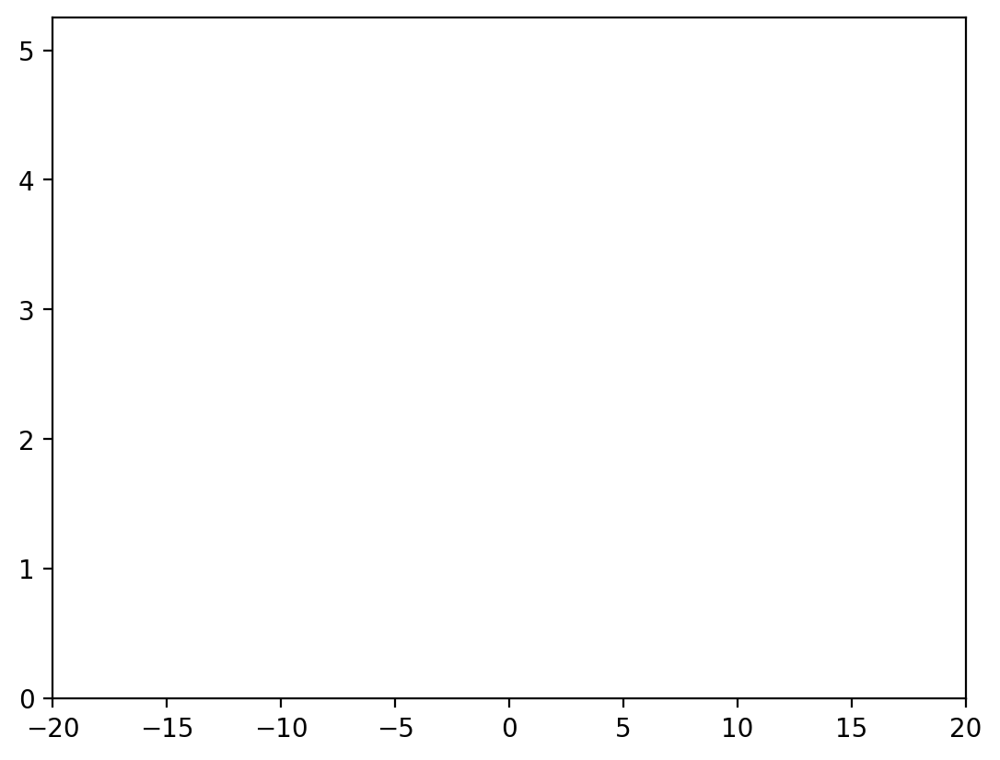

In [15]:
lat=43.5
lon=-4.5

lat=53
lon=5
plt.figure()
ax = plt.subplot(111)
ax.hist(onemem_ens.isel(source_id=idx_ds).mean(dim='model').sel(longitude=lon,latitude=lat,method='nearest'))
ax.axvline(x=onemem_ens.mean(dim='source_id').sel(longitude=lon,latitude=lat,method='nearest'),color='red')

ax.set_xlim([-20,20])

In [16]:
.25*std.mean()

<xarray.DataArray 'num_joint_extremes' ()>
array(1.02470398)
Coordinates:
    height    float64 10.0
    quantile  float64 0.98
    ssp       <U6 'ssp585'

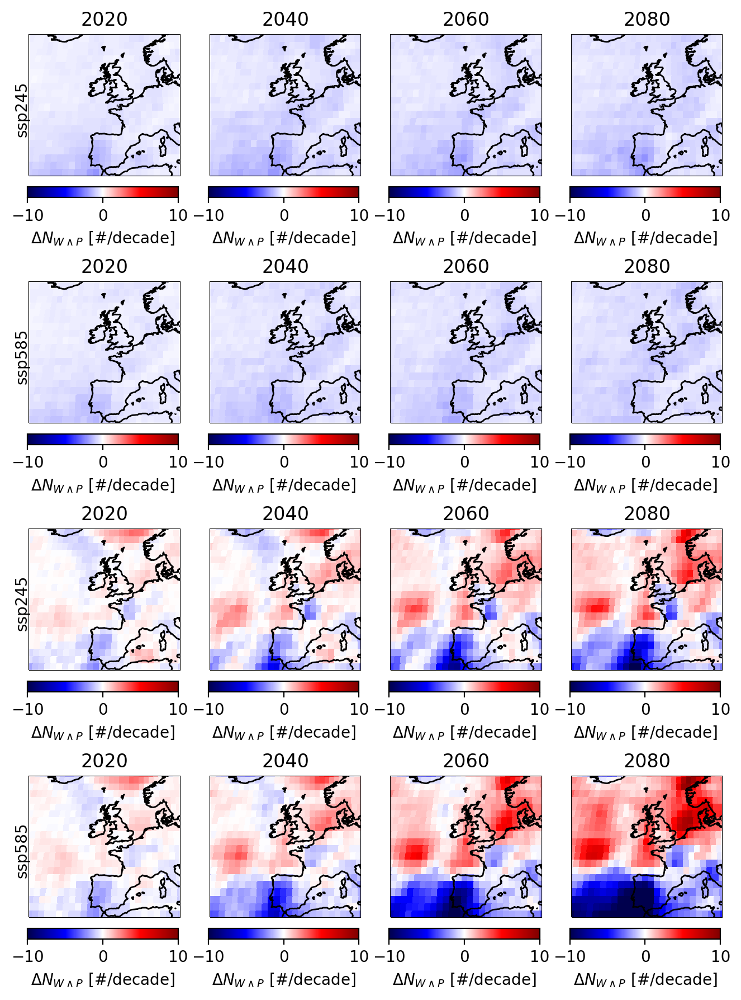

In [22]:
np.random.seed(seed=0)

fig=plt.figure(figsize=(8,11)) #generate figure  
gs = fig.add_gridspec(4,4)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

        canesm_ds =ssp_ds_diff.sel(source_id='CanESM5').dropna(dim='member_id')
        
        combs = list(itertools.combinations(np.arange(len(canesm_ds.member_id)), 6))
        idx=np.random.randint(0,len(combs),size=500)
        idx_ds = xr.DataArray(np.array([combs[k] for k in idx]),dims=['n','member'])

        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (.25*canesm_ds.isel(member_id=idx_ds).mean(dim='member').quantile(.17,dim='n')-.25*canesm_ds.mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        if w==0:
                ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
        
        
        signs = np.sign(canesm_ds.isel(member_id=idx_ds).mean(dim='member'))
        num_positive = (signs==1).sum(dim='n')
        frac_pos = num_positive/len(signs.n)
        frac_neg = 1-frac_pos
        frac_agree = frac_pos
        frac_agree = frac_agree.where(frac_pos>frac_neg,frac_neg)
        
        ax = plt.subplot(gs[s+2,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (.25*canesm_ds.mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        #sc = (frac_agree).plot(cmap='Reds',vmin=.5,vmax=1,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        if w==0:
                ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)


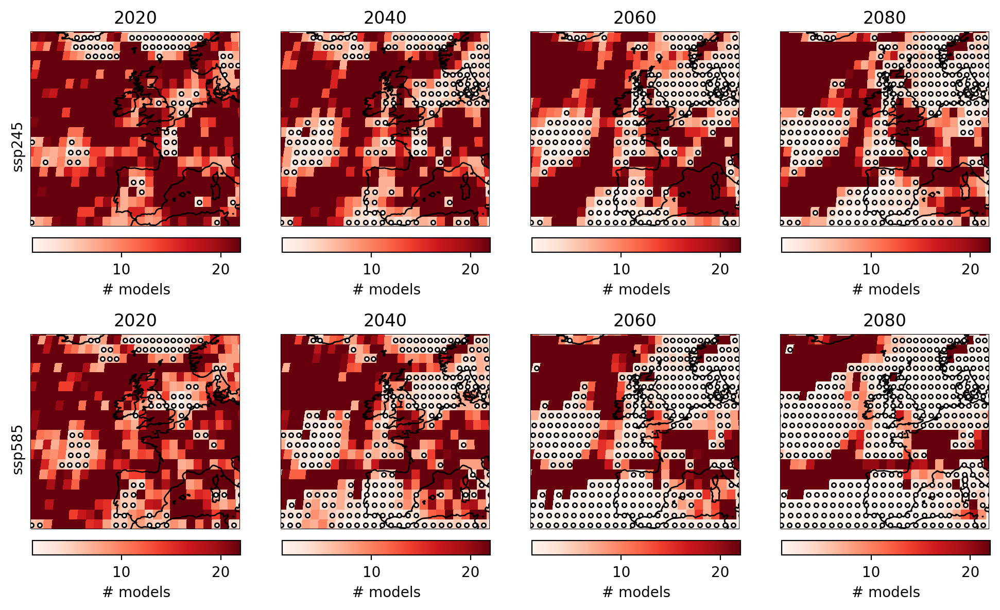

In [20]:
np.random.seed(seed=0)

fig=plt.figure(figsize=(12,7)) #generate figure  
gs = fig.add_gridspec(2,4)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

        canesm_ds =ssp_ds_diff.sel(source_id='CanESM5').dropna(dim='member_id')
     
        n_samps = 2000
        for i in np.arange(len(canesm_ds.member_id)-1):
            n_models = i+1
            combs = list(itertools.combinations(np.arange(len(canesm_ds.member_id)), n_models))
            if len(combs)>n_samps:
                idx=np.random.randint(0,len(combs),size=n_samps)
                idx_ds = xr.DataArray(np.array([combs[k] for k in idx]),dims=['n','member'])
            else:
                idx_ds = xr.DataArray(np.array([combs[k] for k in np.arange(len(combs))]),dims=['n','member'])
        
            signs = np.sign(canesm_ds.isel(member_id=idx_ds).mean(dim='member'))
            frac_positive = (signs==np.sign(ssp_ds_diff.mean(dim='member_id').mean(dim='source_id'))).sum(dim='n')/len(signs.n)
            if i==0:
                frac_positive_ds = frac_positive
            else:
                frac_positive_ds = xr.concat((frac_positive_ds,frac_positive),dim='n_models')
        frac_positive_ds = frac_positive_ds.assign_coords({'n_models':np.arange(len(canesm_ds.member_id)-1)+1})
        
        
        agrees = frac_positive_ds>=.9
        
        subsequent_sum = frac_positive_ds.copy(deep=True)
        for k in np.arange(len(agrees.n_models)):
            subsequent_sum[k,:,:] = agrees.where(agrees==1).isel(n_models=np.arange(k,len(agrees.n_models))).sum(dim='n_models',skipna=False).values
        
        
        #test = frac_positive_ds.where(frac_positive_ds>=.9,-999)
        
        agrees = agrees.where(np.isfinite(subsequent_sum),-999)
        #test = test.where(test!=0)
        first_n = agrees.argmax(dim='n_models')#.where(~np.isfinite(frac_positive_ds.where((frac_positive_ds>.1) & (frac_positive_ds<.9))))
        #first_n = first_n.where(frac_positive_ds.where(frac_positive_ds>=.9).all(dim='n_models'))
        first_n = first_n.where(agrees.any(dim='n_models'),100)
        first_n = first_n.where(np.isfinite(subsequent_sum.isel(n_models=first_n.astype('int'))),100)
        first_n = first_n+1
        #first n and all subsequent n also?
        
        
        
                                                                                     
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (first_n).plot(cmap='Reds',vmin=1,vmax=22,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        #first_n.plot.contour(levels=[1,6],colors=['black','grey'],transform=ccrs.PlateCarree(),ax=ax,zorder=10)
    
        
        [LON,LAT] = np.meshgrid(ssp_ds.longitude,ssp_ds.latitude)
        ax.scatter(LON.flatten()[first_n.values.flatten()<7],LAT.flatten()[first_n.values.flatten()<7],edgecolor='black',facecolor='white',transform=ccrs.PlateCarree(),zorder=7,marker='o',s=9)
    
        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='# models')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        if w==0:
                ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
        '''
        ax = plt.subplot(gs[s+2,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        signs = np.sign(onemem_ens.isel(source_id=idx_ds).mean(dim='model'))
        num_positive = (signs==1).sum(dim='n')
        frac_pos = num_positive/len(signs.n)
        frac_neg = 1-frac_pos
        frac_agree = frac_pos
        frac_agree = frac_agree.where(frac_pos>frac_neg,frac_neg)
        
        ambiguous = (((num_positive/len(signs.n))>.1) & ((num_positive/len(signs.n))<.9))
        #np.sign(onemem_ens.isel(source_id=idx_ds).mean(dim='model')).all(dim='n')
        
        #sc = (.25*onemem_ens.isel(source_id=idx_ds).mean(dim='model').quantile(.83,dim='n')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        #sc = (~ambiguous).plot(cmap='seismic',vmin=0,vmax=1,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc = (frac_agree).plot(cmap='Reds',vmin=.5,vmax=1,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        #sc = (.25*std).plot(cmap='Reds',vmin=0,vmax=2,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        if w==0:
                ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
        '''

typical difference of 6-member ensemble means minus 22-ensemble mean

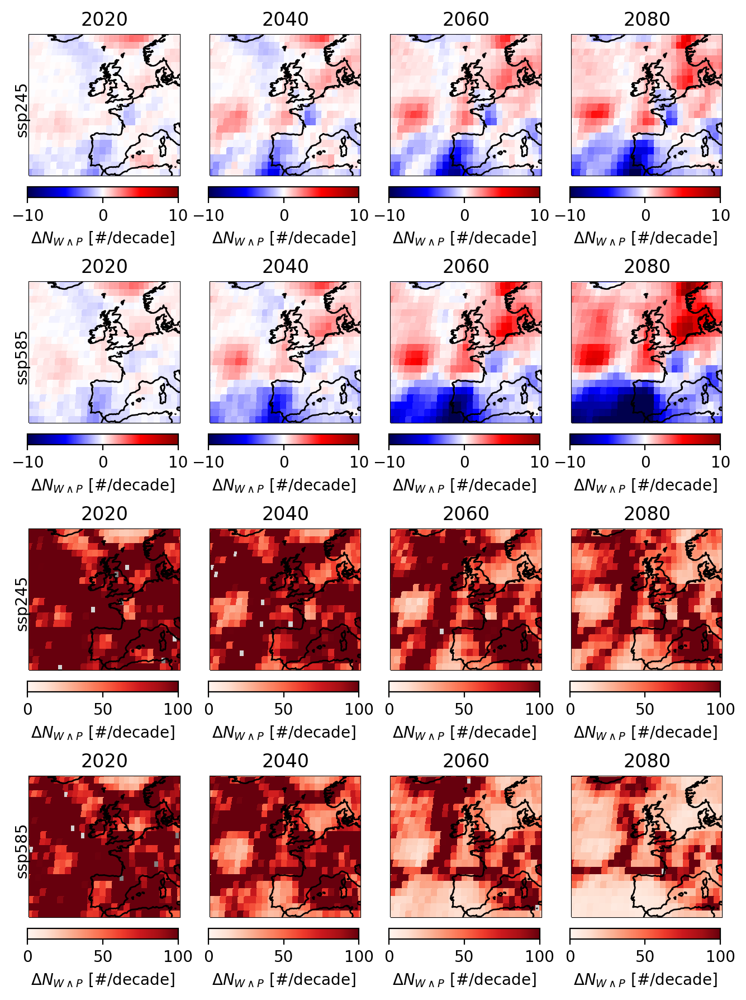

In [45]:
np.random.seed(seed=0)

fig=plt.figure(figsize=(8,11)) #generate figure  
gs = fig.add_gridspec(4,4)

for s,ssp in enumerate(['ssp245','ssp585']):
    for w,window in enumerate(np.array([2020,2040,2060,2080])):
        ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

        canesm_ds =ssp_ds_diff.sel(source_id='CanESM5').dropna(dim='member_id')
        
        combs = list(itertools.combinations(np.arange(len(canesm_ds.member_id)), 6))
        idx=np.random.randint(0,len(combs),size=300)
        idx_ds = xr.DataArray(np.array([combs[k] for k in idx]),dims=['n','member'])

        #6mem mean diff with all mem mean diff
        std = np.sqrt(((canesm_ds.isel(member_id=idx_ds).mean(dim='member') - canesm_ds.mean(dim='member_id'))**2).mean(dim='n'))
        
        
        ax = plt.subplot(gs[s,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc = (.25*canesm_ds.mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        if w==0:
                ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
        
        ax = plt.subplot(gs[s+2,w],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        #sc = (.25*canesm_ds.isel(member_id=idx_ds).mean(dim='member').std(dim='n')).plot(cmap='Reds',vmin=0,vmax=7.5,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc = (100*std/np.abs(canesm_ds.mean(dim='member_id'))).plot(cmap='Reds',vmin=0,vmax=100,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        ax.coastlines(zorder=5)
        #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

        cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta  N_{W\wedge P}$ [#/decade]')
        ax.set_title(str(window))

        sc.set_edgecolor('face')
        if w==0:
                ax.annotate(ssp,xy=(-.1,.3),xycoords='axes fraction',rotation=90)
        

In [40]:
std

<xarray.DataArray 'num_joint_extremes' (latitude: 27, longitude: 35)>
array([[4.42894938, 5.27118899, 4.58727427, 3.86280363, 3.15663968,
        2.93874249, 2.11284432, 2.76531426, 3.1930886 , 2.37683263,
        2.53046695, 2.29122319, 2.14229887, 2.85042427, 2.4051642 ,
        3.10091982, 2.56569606, 2.97833225, 2.4629078 , 2.67237306,
        3.30691699, 3.28915333, 3.26968172, 2.95374652, 3.72413947,
        4.58211499, 5.56419606, 6.41505232, 5.71936023, 5.70444856,
        4.56916315, 4.01202083, 3.27302952, 2.44907466, 2.19097813],
       [3.98095466, 2.78296937, 3.29235534, 3.42323001, 3.11697978,
        2.96230516, 3.34951406, 3.10635311, 3.5170558 , 3.27154002,
        2.56395311, 2.92851561, 3.07853861, 2.58468853, 2.72828463,
        3.33874505, 3.23947698, 2.63929143, 3.82781197, 3.42361083,
        2.72964928, 2.94445367, 2.63809555, 3.88494006, 4.01025122,
        4.53744013, 5.50283866, 6.37200096, 6.48979113, 5.75546729,
        4.89301278, 3.06399763, 2.85506438, 1.47661149, 1.15392406],
       [1.9708496 , 2.49062316, 2.56897804, 2.54054383, 1.85894833,
        1.73302561, 2.11540295, 3.03398039, 3.21746565, 3.68284109,
        2.74350479, 2.75350955, 2.90026308, 3.20797386, 3.27887628,
        3.13581462, 3.33131828, 3.16102363, 3.19214313, 2.96537425,
        3.23360938, 3.03339744, 2.58016795, 4.45860093, 4.16614352,
        4.69165335, 5.62426127, 5.77262698, 4.64533019, 4.19776175,
...
        3.76363398, 3.92467975, 4.36900065, 3.6895473 , 4.16040863,
        4.76080837, 4.21305994, 5.44147617, 6.06003453, 5.95734716,
        5.87855172, 3.96270577, 2.74773712, 2.69434937, 2.60244401,
        1.88997256, 2.45265163, 2.13368053, 2.03142533, 1.48681987,
        2.16781679, 2.41204616, 2.48129521, 2.2750002 , 2.84422286,
        2.9865842 , 3.18629879, 3.82802144, 3.79684274, 3.7482381 ],
       [3.80284981, 3.41664282, 3.80057354, 3.50363039, 3.41125588,
        3.82482728, 3.93346327, 4.16923787, 4.07363019, 4.64990442,
        3.26667971, 3.08279755, 3.89266927, 4.76565762, 4.61318842,
        4.82985354, 2.68609589, 1.81600702, 1.19704265, 1.29199817,
        1.91498574, 1.88338741, 2.00936142, 2.08323911, 2.31718459,
        2.89486838, 3.08605946, 2.68577115, 2.21557199, 2.81487385,
        3.41211458, 2.55217772, 3.36104646, 2.62165766, 3.29746929],
       [3.31603065, 3.2710696 , 3.01015257, 2.55742926, 3.01561983,
        3.29742267, 3.21995917, 3.35977127, 3.65064987, 3.92896462,
        2.64075326, 2.93060416, 2.97801761, 3.63487735, 4.13472423,
        4.11309111, 1.81971711, 1.21391317, 0.91406499, 1.39465514,
        1.72437858, 1.50407841, 1.70029518, 1.79591512, 2.15879081,
        2.79292559, 2.90933364, 2.30185432, 2.14268091, 2.75912426,
        3.76696164, 2.72293075, 2.93193654, 2.93685143, 3.06904557]])
Coordinates:
  * latitude   (latitude) float64 70.0 68.5 67.0 65.5 ... 35.5 34.0 32.5 31.0
  * longitude  (longitude) float64 -30.0 -28.5 -27.0 -25.5 ... 18.0 19.5 21.0
    source_id  <U15 'CanESM5'
    height     float64 10.0
    quantile   float64 0.98
    ssp        <U6 'ssp585'

In [ ]:
fig=plt.figure(figsize=(6,7.25)) #generate figure  
gs = fig.add_gridspec(2,2)
gs.update(hspace=.2)

ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

#historical CMIP
ax = plt.subplot(gs[0,1],projection=ccrs.Robinson(central_longitude=0))

ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

#sc=(.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id')).plot(cmap='Reds',vmin=0,vmax=30,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)

sc=(.25*ssp_ds_diff.mean(dim='member_id').mean(dim='source_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
#cs = model_diff_gt_mem_diff.isel(n=0).plot.contour(levels=[0,1],ax=ax,transform=ccrs.PlateCarree(),zorder=5,colors=['grey','grey'])
cs = mem_diff_gt_ensmean.isel(n=0).plot.contour(levels=[0,1],ax=ax,transform=ccrs.PlateCarree(),zorder=5,colors=['grey','grey'])
ax.coastlines(zorder=5)
#sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())

cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{W\wedge P}$ [#/decade]')
ax.set_title('')


sc.set_edgecolor('face')

In [25]:
m

2

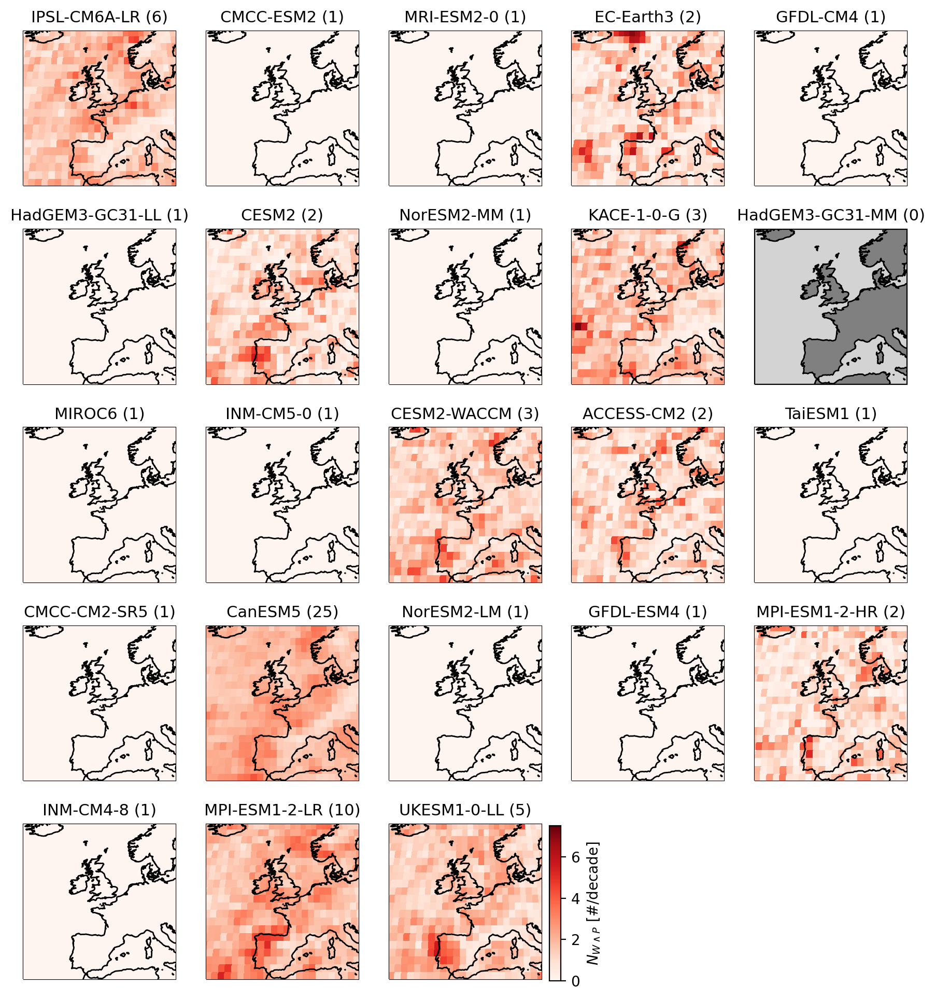

In [71]:
for s,ssp in enumerate(['ssp585']):
    ssp_ds_diff = (n_wp.sel(window=window)-n_wp.sel(window=2000)).sel(ssp=ssp)#n_wp_diff.sel(ssp=ssp)

    fig=plt.figure(figsize=(11,12)) #generate figure  
    gs = fig.add_gridspec(5,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(5,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
       
        sc=(.25*ssp_ds_diff.sel(source_id=model).std(dim='member_id')).plot(cmap='Reds',vmin=0,vmax=7.5,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc.set_edgecolor('face')
        ax.coastlines(zorder=5)    
        ax.set_extent([-20, 15, 35, 66], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_diff.sel(source_id=model)).sum(dim='member_id')[0,0].values
        ax.set_title(model +' ('+str(n_members)+')',size=11)
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$N_{W\wedge P}$ [#/decade]')
